## ASSIGNMENT - 3
TEAM MEMBERS

1. SIDDHARTH S DESAI, 23042
2. ROMIT BHAUMIK, 23024
3. SUDHARSHAN VISHWANATHAN, 22842

### Imports


In [1]:
import cv2
import torch
from torch.utils.data import Dataset
from torchvision import transforms
from PIL import Image
import os
import random
import torch.nn as nn
import torch.nn.functional as F
from tqdm import tqdm
import matplotlib.pyplot as plt 
from scipy import linalg
from torchvision.models import inception_v3
from torch.utils.data import DataLoader, Subset
from torch.autograd import Variable
import numpy as np
import torch.optim as optim
from torch.utils.data import random_split
from sklearn.metrics import f1_score
from torchvision import models
import shutil
import pandas as pd 
from sklearn.mixture import GaussianMixture
from sklearn.metrics import confusion_matrix, classification_report
import seaborn as sns
import math
from torch import einsum
from einops import rearrange
from functools import partial
import time
from torchvision.utils import save_image
from torch.utils.data import TensorDataset
from torchvision.utils import make_grid
from torchvision.transforms import ToPILImage
from torch.cuda.amp import GradScaler, autocast

os.environ['PYTORCH_CUDA_ALLOC_CONF'] = 'expandable_segments:True'

data_folder_butterfly = '/home/siddharth/siddharth/ADRL/Data/Butterfly'
data_folder_aug_butterfly = '/home/siddharth/siddharth/ADRL/Data/Butterfly_aug/Train_Aug'
data_folder_animals = '/home/siddharth/siddharth/ADRL/Data/animals'
data_folder_aug_animals = '/home/siddharth/siddharth/ADRL/Data/Animals_aug'

### 1. Preprocessing of the data

In [3]:
# Function to flip images
def copy_folders_and_flip_images(src_dir, dest_dir):
    # If dest_dir path doesn't exist, create it
    if not os.path.exists(dest_dir):
        os.makedirs(dest_dir)
    if os.path.exists(dest_dir):
        shutil.rmtree(dest_dir)
    
    shutil.copytree(src_dir, dest_dir)
    
    for root, dirs, files in os.walk(dest_dir):
        for file in files:
            file_path = os.path.join(root, file)
            try:
                with Image.open(file_path) as img:    
                    flipped_img = img.transpose(Image.FLIP_LEFT_RIGHT)
                    file_name, ext = os.path.splitext(file)
                    flipped_file_path = os.path.join(root, f"{file_name}_flipped{ext}")
                    flipped_img.save(flipped_file_path)
            except Exception as e:
                print(f"Error processing {file_path}: {e}")
                
def preprocess(data_folder):
    #List every subfolder in the data folder 
    subfolders = [f.path for f in os.scandir(data_folder) if f.is_dir()]
    print(subfolders)
    #Check size of each image in each subfolder and if shape is not 128x128x3 then resize it to 128x128x3
    for folder in subfolders:
        for filename in os.listdir(folder):
            img = cv2.imread(os.path.join(folder, filename))
            if img.shape != (128, 128, 3):
                print('Resizing image: ', os.path.join(folder, filename))
                img = cv2.resize(img, (128, 128))
                cv2.imwrite(os.path.join(folder, filename), img)
                print("Resized shape is: ", img.shape)
            else:
                print('Image size is correct: ', os.path.join(folder, filename))
    print('Preprocessing done')

### 2. Dataset class 

In [2]:
class AnimalsDataset(Dataset):
    def __init__(self, data_folder, transform=None):
        self.data_folder = data_folder
        self.subfolders = [f.path for f in os.scandir(data_folder) if f.is_dir()]
        self.data = []
        self.label_map = {}
        for i, folder in enumerate(self.subfolders):
            for filename in os.listdir(folder):
                image_path = os.path.join(folder, filename)
                label_name = folder.split('/')[-1]
                self.label_map[label_name] = i
                self.data.append((image_path,i))          
        random.shuffle(self.data)
        
    def __len__(self):
        return len(self.data)
    
    def transform(self, img):
        img_transform = transforms.Compose([
            transforms.ToTensor(),
            transforms.Normalize((0.5, 0.5, 0.5), (0.5, 0.5, 0.5))
        ])
        return img_transform(img)
    
    def __getitem__(self, idx):
        if isinstance(idx, int):  
            img = cv2.imread(self.data[idx][0])  
            label = self.data[idx][1] 
            img = self.transform(img)  
            return img, label
        
        elif isinstance(idx, slice):  
            indices = range(*idx.indices(len(self.data)))
            batch_imgs = []
            batch_labels = []
            for i in indices:
                img = cv2.imread(self.data[i][0])  
                img = self.transform(img)  
                batch_imgs.append(img)
                batch_labels.append(self.data[i][1])
            return torch.stack(batch_imgs), batch_labels

        elif isinstance(idx, list):  
            batch_imgs = []
            batch_labels = []
            for i in idx:
                img = cv2.imread(self.data[i][0])  
                img = self.transform(img)  
                batch_imgs.append(img)
                batch_labels.append(self.data[i][0])
            
            # Return batch of images and labels
            return torch.stack(batch_imgs), batch_labels
        
        
class ButterflyDataset(Dataset):
    def __init__(self, data_folder):
        self.data_folder = data_folder
        self.desc_path = f'{data_folder}/descriptions.csv'
        self.subfolders = [f.path for f in os.scandir(data_folder) if f.is_dir()]
        desc_df = pd.read_csv(self.desc_path)
        self.data = []
        self.label_map = {}
        count_labels = 0
        for filename in os.listdir(self.subfolders[0]):
            image_path = os.path.join(self.subfolders[0], filename)
            #print(image_path)
            image_name = filename.split('_flipped')[0]
            if(not image_name.endswith('.jpg')):
                image_name = image_name + '.jpg'
            label_name = desc_df[desc_df['filename'] == image_name]['label'].values[0]
            if label_name not in self.label_map:
                self.label_map[label_name] = count_labels
                count_labels += 1
            self.data.append((image_path, self.label_map[label_name]))
        random.shuffle(self.data)
    
    def __len__(self):
        return len(self.data)
    
    def transform(self, img):
        img_transform = transforms.Compose([
            transforms.ToTensor(),
            transforms.Normalize((0.5, 0.5, 0.5), (0.5, 0.5, 0.5))
        ])
        return img_transform(img)
    
    def __getitem__(self, idx):
        if isinstance(idx, int):  
            img_path, label = self.data[idx]
            img = Image.open(img_path).convert('RGB')  # Convert to PIL Image
            img = self.transform(img)  
            return img, label
        
        elif isinstance(idx, slice):  
            indices = range(*idx.indices(len(self.data)))
            batch_imgs = []
            batch_labels = []
            for i in indices:
                img_path, label = self.data[i]
                img = Image.open(img_path).convert('RGB')  # Convert to PIL Image
                img = self.transform(img)  
                batch_imgs.append(img)
                batch_labels.append(label)
            return torch.stack(batch_imgs), batch_labels

        elif isinstance(idx, list):  
            batch_imgs = []
            batch_labels = []
            for i in idx:
                img_path, label = self.data[i]
                img = Image.open(img_path).convert('RGB')  # Convert to PIL Image
                img = self.transform(img)  
                batch_imgs.append(img)
                batch_labels.append(label)
            
            # Return batch of images and labels
            return torch.stack(batch_imgs), batch_labels
        

### 3. DDPM (Q.1)

#### a. Architecture 1:  (Without Attention)

**Overall Structure**: The  architecture follows a U-Net design, with distinct downsampling, middle processing, and upsampling stages. This structure enables the model to capture hierarchical features for the diffusion process.

**Time Embeddings**: Time embeddings are incorporated throughout the network to provide temporal information at each stage, enabling the model to account for the progression of the diffusion process.

**Encoder (Downsampling)**: The downsampling blocks reduce spatial dimensions while capturing relevant features using convolutional layers with normalization and activation. Skip connections preserve information for later reconstruction.

**Bottleneck (Middle Processing)**: The middle block processes features globally at the smallest spatial resolution, providing a deeper representation of the input.

**Decoder (Upsampling)**: The upsampling blocks restore the spatial dimensions while integrating features from the encoder through skip connections, ensuring high-fidelity reconstruction.

**Final Convolution**: A final convolutional layer maps the output back to the original image space, completing the denoising process.

**Limitations**: The architecture lacks attention mechanisms, which may reduce its ability to model long-range dependencies and global context effectively.

In [ ]:
class forward_diff(nn.Module):
    def __init__(self, cfg):
        super(forward_diff, self).__init__()

        num_time_steps = cfg["num_timesteps"]
        beta_start = cfg["beta_start"]
        beta_end = cfg["beta_end"]
        
        self.betas = torch.linspace(beta_start, beta_end, num_time_steps)    
        self.alphas = 1 - self.betas
        self.alphas_cumprod = torch.cumprod(self.alphas, dim=0)
        self.sqrt_alphas_cumprod = torch.sqrt(self.alphas_cumprod)
        self.sqrt_one_minus_alphas_cumprod = torch.sqrt(1 - self.alphas_cumprod)

    def add_noise(self, orig_img, noise, t):
        sqrt_alpha_bar_t = self.sqrt_alphas_cumprod.to(orig_img.device)[t]
        sqrt_one_minus_alpha_bar_t = self.sqrt_one_minus_alphas_cumprod.to(orig_img.device)[t]  

        sqrt_alpha_bar_t = sqrt_alpha_bar_t[:, None, None, None]    
        sqrt_one_minus_alpha_bar_t = sqrt_one_minus_alpha_bar_t[:, None, None, None]

        return sqrt_alpha_bar_t * orig_img + sqrt_one_minus_alpha_bar_t * noise

class reverse_diff(nn.Module):
    def __init__(self, cfg):
        super(reverse_diff, self).__init__()

        num_time_steps = cfg["num_timesteps"]
        beta_start = cfg["beta_start"]
        beta_end = cfg["beta_end"]

        self.betas = torch.linspace(beta_start, beta_end, num_time_steps)    
        self.alphas = 1 - self.betas
        self.alphas_cumprod = torch.cumprod(self.alphas, dim=0)

    def sample_q(self, xt, noise, t):
        x0 = xt - (torch.sqrt(1-self.alphas_cumprod.to(xt.device)[t]) * noise)
        x0 = x0/torch.sqrt(self.alphas_cumprod.to(xt.device)[t])
        # x0 = torch.clamp(x0, -1., 1.) # Clipping values between -1 and 1

        mean = (xt - ((1-self.alphas.to(xt.device)[t]) * noise)/(torch.sqrt(1 - self.alphas_cumprod.to(xt.device)[t])))
        mean = mean/(torch.sqrt(self.alphas.to(xt.device)[t]))

        if(t==0):
            return mean, x0
        else:
            variance = (1-self.alphas_cumprod.to(xt.device)[t-1])/(1-self.alphas_cumprod.to(xt.device)[t])  
            variance = variance * self.betas.to(xt.device)[t]
            sigma = variance ** 0.5
            z = torch.randn(xt.shape).to(xt.device) 

            return mean + sigma*z, x0


def get_time_embedding(
    time_steps: torch.Tensor,
    t_emb_dim: int
) -> torch.Tensor:
    
    # Ensure the embedding dimension is even
    assert t_emb_dim % 2 == 0, "time embedding dimension must be divisible by 2."
    
    # Create a scaling factor for the embedding
    factor = 2 * torch.arange(start=0, end=t_emb_dim // 2, dtype=torch.float32, device=time_steps.device) / t_emb_dim
    factor = 10000 ** factor

    # Expand time_steps to match the embedding dimension
    t_emb = time_steps[:, None]  
    t_emb = t_emb / factor  

    # Concatenate sinusoidal functions for final embedding
    t_emb = torch.cat([torch.sin(t_emb), torch.cos(t_emb)], dim=1)  
    
    return t_emb


class NormActivation(nn.Module):
    def __init__(self, in_channels: int, out_channels: int, num_groups: int = 8, kernel_size: int = 3,
                 norm: bool = True, act: bool = True):
        super(NormActivation, self).__init__()

        # GroupNorm
        self.g_norm = nn.GroupNorm(num_groups, in_channels) if norm is True else nn.Identity()

        # Activation
        self.act = nn.SiLU() if act is True else nn.Identity()

        # Conv Layer
        self.conv = nn.Conv2d(in_channels, out_channels, kernel_size, padding=(kernel_size - 1) // 2)

    def forward(self, x):
        return self.conv(self.act(self.g_norm(x)))
    

class TimeEmbedding(nn.Module):
    def __init__(self, n_out: int, t_dim: int = 128):
        super(TimeEmbedding, self).__init__()
        self.time_emb = nn.Sequential(
            # nn.Linear(t_dim, t_dim),
            nn.SiLU(),
            nn.Linear(t_dim, n_out)
        )

    def forward(self, t):
        return self.time_emb(t)
        

class Downsample(nn.Module):
    def __init__(self, in_channels: int, out_channels: int, k: int = 2, use_conv: bool = True, use_mpool: bool = True):
        super(Downsample, self).__init__()

        self.use_conv = use_conv
        self.use_mpool = use_mpool

        self.conv = nn.Sequential(
            nn.Conv2d(in_channels, in_channels, kernel_size=1),
            nn.Conv2d(in_channels, out_channels // 2 if use_mpool else out_channels, kernel_size=4, stride=k, padding=1)
        ) if use_conv else nn.Identity()
        
        self.mpool = nn.Sequential(
            nn.MaxPool2d(k, k),
            nn.Conv2d(in_channels, out_channels // 2 if use_conv else out_channels, kernel_size=1, stride=1, padding=0)
        ) if use_mpool else nn.Identity()

    def forward(self, x):
        if not self.use_conv:
            return self.mpool(x)
        if not self.use_mpool:
            return self.conv(x)
        return torch.cat([self.conv(x), self.mpool(x)], dim=1)
    

class Upsample(nn.Module):
    def __init__(self, in_channels: int, out_channels: int, k: int = 2, use_conv: bool = True, use_upsample: bool = True):
        super(Upsample, self).__init__()

        self.use_conv = use_conv
        self.use_upsample = use_upsample

        self.conv = nn.Sequential(
            nn.ConvTranspose2d(
                in_channels,
                out_channels // 2 if use_upsample else out_channels,
                kernel_size=4,
                stride=k,
                padding=1
            ),
            nn.Conv2d(
                out_channels // 2 if use_upsample else out_channels,
                out_channels // 2 if use_upsample else out_channels,
                kernel_size=1,
                stride=1,
                padding=0
            )
        ) if use_conv else nn.Identity()

        self.up = nn.Sequential(
            nn.Upsample(
                scale_factor=k,
                mode='bilinear',
                align_corners=False
            ),
            nn.Conv2d(
                in_channels,
                out_channels // 2 if use_conv else out_channels,
                kernel_size=1,
                stride=1,
                padding=0
            )
        ) if use_upsample else nn.Identity()

    def forward(self, x):
        if not self.use_conv:
            return self.up(x)
        if not self.use_upsample:
            return self.conv(x)
        return torch.cat([self.conv(x), self.up(x)], dim=1)



class DownConv(nn.Module):
    def __init__(self, 
                 in_channels: int, 
                 out_channels: int, 
                 t_emb_dim: int = 128,  
                 num_layers: int = 2,
                 down_sample: bool = True 
                ):
        super(DownConv, self).__init__()
        
        self.num_layers = num_layers
        
        # Define the first set of convolution layers with normalization and activation
        self.conv1 = nn.ModuleList([
            NormActivation(in_channels if i == 0 else out_channels, 
                           out_channels
                          ) for i in range(num_layers)
        ])
        
        # Define the second set of convolution layers
        self.conv2 = nn.ModuleList([
            NormActivation(out_channels, 
                           out_channels
                          ) for _ in range(num_layers)
        ])
        
        # Time embedding block
        self.te_block = nn.ModuleList([
            TimeEmbedding(out_channels, t_emb_dim) for _ in range(num_layers)
        ])
        
        # Downsampling block
        self.down_block = Downsample(out_channels, out_channels) if down_sample else nn.Identity()
        
        # Residual connection using 1x1 convolutions
        self.res_block = nn.ModuleList([
            nn.Conv2d(
                in_channels if i == 0 else out_channels, 
                out_channels, 
                kernel_size=1
            ) for i in range(num_layers)
        ])
        
    def forward(self, x, t_emb):
        out = x
        
        for i in range(self.num_layers):
            resnet_input = out
            
            # ResNet Block with time embedding and residual connection
            out = self.conv1[i](out)
            out = out + self.te_block[i](t_emb)[:, :, None, None]
            out = self.conv2[i](out)
            out = out + self.res_block[i](resnet_input)

        # Downsampling
        out = self.down_block(out)
        
        return out



class MidConv(nn.Module):
    def __init__(self, 
                 in_channels: int, 
                 out_channels: int,
                 t_emb_dim: int = 128,
                 num_layers: int = 2):
        super(MidConv, self).__init__()
        
        self.num_layers = num_layers
        
        # First and second convolution layers
        self.conv1 = nn.ModuleList([
            NormActivation(in_channels if i == 0 else out_channels, out_channels)
            for i in range(num_layers+1)
        ])
        self.conv2 = nn.ModuleList([
            NormActivation(out_channels, out_channels) for _ in range(num_layers+1)
        ])
        
        # Time embedding and residual blocks
        self.te_block = nn.ModuleList([TimeEmbedding(out_channels, t_emb_dim) for _ in range(num_layers+1)])
        self.res_block = nn.ModuleList([
            nn.Conv2d(in_channels if i == 0 else out_channels, out_channels, kernel_size=1)
            for i in range(num_layers+1)
        ])
        
    def forward(self, x, t_emb):
        out = x
        for i in range(self.num_layers):
            resnet_input = out
            out = self.conv1[i](out)
            out = out + self.te_block[i](t_emb)[:, :, None, None]
            out = self.conv2[i](out)
            out = out + self.res_block[i](resnet_input)
        return out



class UpConv(nn.Module):
    def __init__(self, 
                 in_channels:int, 
                 out_channels:int, 
                 t_emb_dim:int = 128, # Time Embedding Dimension
                 num_layers:int = 2,
                 up_sample:bool = True # True for Upsampling
                ):
        super(UpConv, self).__init__()
        
        self.num_layers = num_layers
        
        self.conv1 = nn.ModuleList([
            NormActivation(in_channels if i==0 else out_channels, 
                        out_channels
                       ) for i in range(num_layers)
        ])
        
        self.conv2 = nn.ModuleList([
            NormActivation(out_channels, 
                        out_channels
                       ) for _ in range(num_layers)
        ])
        
        self.te_block = nn.ModuleList([
            TimeEmbedding(out_channels, t_emb_dim) for _ in range(num_layers)
        ])
        
        # self.attn_block = nn.ModuleList([
        #     SelfAttentionBlock(out_channels) for _ in range(num_layers)
        # ])
        
        self.up_block =Upsample(in_channels, in_channels//2) if up_sample else nn.Identity()
        
        self.res_block = nn.ModuleList([
            nn.Conv2d(
                in_channels if i==0 else out_channels, 
                out_channels, 
                kernel_size=1
            ) for i in range(num_layers)
        ])
        
    def forward(self, x, down_out, t_emb):
        
        # Upsampling
        x = self.up_block(x)
        x = torch.cat([x, down_out], dim=1)
        
        out = x
        for i in range(self.num_layers):
            resnet_input = out
            
            # Resnet Block
            out = self.conv1[i](out)
            out = out + self.te_block[i](t_emb)[:, :, None, None]
            out = self.conv2[i](out)
            out = out + self.res_block[i](resnet_input)

            
        return out


class Unet(nn.Module):
    def __init__(self,cfg):
        super(Unet, self).__init__()
        
        self.im_channels = cfg["im_channels"]
        self.down_ch = cfg["down_ch"]
        self.mid_ch = cfg["mid_ch"]
        self.up_ch = cfg["up_ch"]
        self.down_sample = cfg["down_sample"]
        self.t_emb_dim = cfg["t_emb_dim"]
        self.num_downc_layers = cfg["num_downc_layers"]
        self.num_midc_layers = cfg["num_midc_layers"]
        self.num_upc_layers = cfg["num_upc_layers"]
        
        self.up_sample = list(reversed(self.down_sample)) # [False, True, True]
        
        # Initial Convolution
        self.cv1 = nn.Conv2d(self.im_channels, self.down_ch[0], kernel_size=3, padding=1)
        
        # Initial Time Embedding Projection
        self.t_proj = nn.Sequential(
            nn.Linear(self.t_emb_dim, self.t_emb_dim), 
            nn.SiLU(), 
            nn.Linear(self.t_emb_dim, self.t_emb_dim)
        )
        
        # DownC Blocks
        self.downs = nn.ModuleList([
            DownConv(
                self.down_ch[i], 
                self.down_ch[i+1], 
                self.t_emb_dim, 
                self.num_downc_layers, 
                self.down_sample[i]
            ) for i in range(len(self.down_ch) - 1)
        ])
        
        # MidC Block
        self.mids = nn.ModuleList([
            MidConv(
                self.mid_ch[i], 
                self.mid_ch[i+1], 
                self.t_emb_dim, 
                self.num_midc_layers
            ) for i in range(len(self.mid_ch) - 1)
        ])
        
        # UpC Block
        self.ups = nn.ModuleList([
            UpConv(
                self.up_ch[i], 
                self.up_ch[i+1], 
                self.t_emb_dim, 
                self.num_upc_layers, 
                self.up_sample[i]
            ) for i in range(len(self.up_ch) - 1)
        ])
        
        # Final Convolution
        self.cv2 = nn.Sequential(
            nn.GroupNorm(8, self.up_ch[-1]), 
            nn.Conv2d(self.up_ch[-1], self.im_channels, kernel_size=3, padding=1)
        )
        
    def forward(self, x, t):
        
        out = self.cv1(x)
        
        # Time Projection
        t_emb = get_time_embedding(t, self.t_emb_dim)
        t_emb = self.t_proj(t_emb)
        
        # DownC outputs
        down_outs = []
        
        for down in self.downs:
            down_outs.append(out)
            out = down(out, t_emb)
        
        # MidC outputs
        for mid in self.mids:
            out = mid(out, t_emb)
        
        # UpC Blocks
        for up in self.ups:
            down_out = down_outs.pop()
            out = up(out, down_out, t_emb)
            
        # Final Conv
        out = self.cv2(out)
        
        return out

#### b Architecture 2:  (With Attention)

The previous U-Net architecture struggled to effectively learn DDPMs due to the lack of attention mechanisms, limiting its ability to capture long-range dependencies.
To overcome this, we introduced self-attention blocks in the downsampling, middle, and upsampling stages of the network.
These attention modules enhance feature representation and improve the model's capacity to understand and model complex diffusion processes.
The updated design combines convolutional layers for local context with attention mechanisms for global context, addressing the limitations of the prior architecture.

In [ ]:
class forward_diff(nn.Module):
    def __init__(self, cfg):
        super(forward_diff, self).__init__()

        num_time_steps = cfg["num_timesteps"]
        beta_start = cfg["beta_start"]
        beta_end = cfg["beta_end"]
        
        self.betas = torch.linspace(beta_start, beta_end, num_time_steps)    
        self.alphas = 1 - self.betas
        self.alphas_cumprod = torch.cumprod(self.alphas, dim=0)
        self.sqrt_alphas_cumprod = torch.sqrt(self.alphas_cumprod)
        self.sqrt_one_minus_alphas_cumprod = torch.sqrt(1 - self.alphas_cumprod)

    def add_noise(self, orig_img, noise, t):
        sqrt_alpha_bar_t = self.sqrt_alphas_cumprod.to(orig_img.device)[t]
        sqrt_one_minus_alpha_bar_t = self.sqrt_one_minus_alphas_cumprod.to(orig_img.device)[t]  

        sqrt_alpha_bar_t = sqrt_alpha_bar_t[:, None, None, None]    
        sqrt_one_minus_alpha_bar_t = sqrt_one_minus_alpha_bar_t[:, None, None, None]

        return sqrt_alpha_bar_t * orig_img + sqrt_one_minus_alpha_bar_t * noise

class reverse_diff(nn.Module):
    def __init__(self, cfg):
        super(reverse_diff, self).__init__()

        num_time_steps = cfg["num_timesteps"]
        beta_start = cfg["beta_start"]
        beta_end = cfg["beta_end"]

        self.betas = torch.linspace(beta_start, beta_end, num_time_steps)    
        self.alphas = 1 - self.betas
        self.alphas_cumprod = torch.cumprod(self.alphas, dim=0)

    def sample_q(self, xt, noise, t):
        x0 = xt - (torch.sqrt(1 - self.alphas_cumprod.to(xt.device)[t]) * noise)
        x0 = x0 / torch.sqrt(self.alphas_cumprod.to(xt.device)[t])

        mean = (xt - ((1 - self.alphas.to(xt.device)[t]) * noise) / (torch.sqrt(1 - self.alphas_cumprod.to(xt.device)[t])))
        mean = mean / (torch.sqrt(self.alphas.to(xt.device)[t]))

        if t == 0:
            return mean, x0
        else:
            variance = (1 - self.alphas_cumprod.to(xt.device)[t - 1]) / (1 - self.alphas_cumprod.to(xt.device)[t])  
            variance = variance * self.betas.to(xt.device)[t]
            sigma = variance ** 0.5
            z = torch.randn(xt.shape).to(xt.device) 

            return mean + sigma * z, x0


def get_time_embedding(time_steps: torch.Tensor, t_emb_dim: int) -> torch.Tensor:
    assert t_emb_dim % 2 == 0, "Time embedding dimension must be divisible by 2."
    factor = 2 * torch.arange(0, t_emb_dim // 2, dtype=torch.float32, device=time_steps.device) / t_emb_dim
    factor = 10000 ** factor
    t_emb = time_steps[:, None] / factor  
    t_emb = torch.cat([torch.sin(t_emb), torch.cos(t_emb)], dim=1)
    return t_emb


class NormActivation(nn.Module):
    def __init__(self, in_channels: int, out_channels: int, num_groups: int = 8, kernel_size: int = 3, norm: bool = True, act: bool = True):
        super(NormActivation, self).__init__()
        self.g_norm = nn.GroupNorm(num_groups, in_channels) if norm else nn.Identity()
        self.act = nn.SiLU() if act else nn.Identity()
        self.conv = nn.Conv2d(in_channels, out_channels, kernel_size, padding=(kernel_size - 1) // 2)

    def forward(self, x):
        return self.conv(self.act(self.g_norm(x)))


class SelfAttentionBlock(nn.Module):
    def __init__(self, channels, num_heads=1):
        super(SelfAttentionBlock, self).__init__()
        self.num_heads = num_heads
        self.norm = nn.GroupNorm(8, channels)
        self.qkv = nn.Conv2d(channels, channels * 3, kernel_size=1)
        self.proj_out = nn.Conv2d(channels, channels, kernel_size=1)

    def forward(self, x):
        batch, channels, height, width = x.shape
        h = self.norm(x)
        qkv = self.qkv(h)
        q, k, v = torch.chunk(qkv, 3, dim=1)
        q = q.reshape(batch, self.num_heads, channels // self.num_heads, height * width)
        k = k.reshape(batch, self.num_heads, channels // self.num_heads, height * width)
        v = v.reshape(batch, self.num_heads, channels // self.num_heads, height * width)
        scale = (channels // self.num_heads) ** -0.5
        weights = torch.softmax(torch.einsum("bhcd,bhkd->bhck", q * scale, k), dim=-1)
        attn_out = torch.einsum("bhck,bhkd->bhcd", weights, v).reshape(batch, channels, height, width)
        return x + self.proj_out(attn_out)


class DownConv(nn.Module):
    def __init__(self, in_channels, out_channels, cfg,t_emb_dim=128, num_layers=2, down_sample=True):
        super(DownConv, self).__init__()
        self.num_layers = num_layers
        self.add_attn = cfg["add_attn_down"]
        self.conv1 = nn.ModuleList([NormActivation(in_channels if i == 0 else out_channels, out_channels) for i in range(num_layers)])
        self.conv2 = nn.ModuleList([NormActivation(out_channels, out_channels) for _ in range(num_layers)])
        self.te_block = nn.ModuleList([TimeEmbedding(out_channels, t_emb_dim) for _ in range(num_layers)])
        self.down_block = Downsample(out_channels, out_channels) if down_sample else nn.Identity()
        self.res_block = nn.ModuleList([nn.Conv2d(in_channels if i == 0 else out_channels, out_channels, kernel_size=1) for i in range(num_layers)])

        self.attn_block = SelfAttentionBlock(out_channels) if self.add_attn else nn.Identity()

    def forward(self, x, t_emb):
        out = x
        for i in range(self.num_layers):
            resnet_input = out
            out = self.conv1[i](out)
            out = out + self.te_block[i](t_emb)[:, :, None, None]
            out = self.conv2[i](out)
            out = out + self.res_block[i](resnet_input)
            out = self.attn_block(out)
            
        out = self.down_block(out)
        return out

class MidConv(nn.Module):
    def __init__(self, in_channels, out_channels, cfg,t_emb_dim=128, num_layers=2):
        super(MidConv, self).__init__()
        self.num_layers = num_layers
        self.add_attn = cfg["add_attn_mid"]
        self.conv1 = nn.ModuleList([NormActivation(in_channels if i == 0 else out_channels, out_channels) for i in range(num_layers+1)])
        self.conv2 = nn.ModuleList([NormActivation(out_channels, out_channels) for _ in range(num_layers+1)])
        self.te_block = nn.ModuleList([TimeEmbedding(out_channels, t_emb_dim) for _ in range(num_layers+1)])
        self.res_block = nn.ModuleList([nn.Conv2d(in_channels if i == 0 else out_channels, out_channels, kernel_size=1) for i in range(num_layers+1)])
        self.attn_block = SelfAttentionBlock(out_channels) if self.add_attn else nn.Identity()

    def forward(self, x, t_emb):
        out = x
        for i in range(self.num_layers):
            resnet_input = out
            out = self.conv1[i](out)
            out = out + self.te_block[i](t_emb)[:, :, None, None]
            out = self.conv2[i](out)
            out = out + self.res_block[i](resnet_input)
            out = self.attn_block(out)
        return out


class UpConv(nn.Module):
    def __init__(self, in_channels, out_channels, cfg, t_emb_dim=128, num_layers=2, up_sample=True):
        super(UpConv, self).__init__()
        self.num_layers = num_layers
        self.add_attn = cfg["add_attn_up"]
        self.conv1 = nn.ModuleList([NormActivation(in_channels if i == 0 else out_channels, out_channels) for i in range(num_layers)])
        self.conv2 = nn.ModuleList([NormActivation(out_channels, out_channels) for _ in range(num_layers)])
        self.te_block = nn.ModuleList([TimeEmbedding(out_channels, t_emb_dim) for _ in range(num_layers)])
        self.up_block = Upsample(in_channels, in_channels // 2) if up_sample else nn.Identity()
        self.res_block = nn.ModuleList([nn.Conv2d(in_channels if i == 0 else out_channels, out_channels, kernel_size=1) for i in range(num_layers)])
        self.attn_block = SelfAttentionBlock(out_channels) if self.add_attn else nn.Identity()
        
    def forward(self, x, down_out, t_emb):
        x = self.up_block(x)
        x = torch.cat([x, down_out], dim=1)
        out = x
        for i in range(self.num_layers):
            resnet_input = out
            out = self.conv1[i](out)
            out = out + self.te_block[i](t_emb)[:, :, None, None]
            out = self.conv2[i](out)
            out = out + self.res_block[i](resnet_input)
            out = self.attn_block(out)
        return out


class TimeEmbedding(nn.Module):
    def __init__(self, out_channels, t_emb_dim):
        super(TimeEmbedding, self).__init__()
        self.time_emb = nn.Sequential(
            nn.Linear(t_emb_dim, out_channels),
            nn.SiLU(),
            nn.Linear(out_channels, out_channels)
        )

    def forward(self, t_emb):
        return self.time_emb(t_emb)

class Upsample(nn.Module):
    def __init__(self, in_channels, out_channels):
        super(Upsample, self).__init__()
        self.up_conv = nn.ConvTranspose2d(in_channels, out_channels, kernel_size=2, stride=2)

    def forward(self, x):
        return self.up_conv(x)


class Downsample(nn.Module):
    def __init__(self, in_channels, out_channels):
        super(Downsample, self).__init__()
        self.down_conv = nn.Conv2d(in_channels, out_channels, kernel_size=2, stride=2)

    def forward(self, x):
        return self.down_conv(x)


class Unet(nn.Module):
    def __init__(self,cfg):
        super(Unet, self).__init__()
        
        self.im_channels = cfg["im_channels"]
        self.down_ch = cfg["down_ch"]
        self.mid_ch = cfg["mid_ch"]
        self.up_ch = cfg["up_ch"]
        self.down_sample = cfg["down_sample"]
        self.t_emb_dim = cfg["t_emb_dim"]
        self.num_downc_layers = cfg["num_downc_layers"]
        self.num_midc_layers = cfg["num_midc_layers"]
        self.num_upc_layers = cfg["num_upc_layers"]
        
        self.up_sample = list(reversed(self.down_sample)) # [False, True, True]
        
        # Initial Convolution
        self.cv1 = nn.Conv2d(self.im_channels, self.down_ch[0], kernel_size=3, padding=1)
        
        # Initial Time Embedding Projection
        self.t_proj = nn.Sequential(
            nn.Linear(self.t_emb_dim, self.t_emb_dim), 
            nn.SiLU(), 
            nn.Linear(self.t_emb_dim, self.t_emb_dim)
        )
        
        # DownC Blocks
        self.downs = nn.ModuleList([
            DownConv(
                self.down_ch[i], 
                self.down_ch[i+1], 
                cfg,
                self.t_emb_dim, 
                self.num_downc_layers, 
                self.down_sample[i]
            ) for i in range(len(self.down_ch) - 1)
        ])
        
        # MidC Block
        self.mids = nn.ModuleList([
            MidConv(
                self.mid_ch[i], 
                self.mid_ch[i+1], 
                cfg,
                self.t_emb_dim, 
                self.num_midc_layers
            ) for i in range(len(self.mid_ch) - 1)
        ])
        add_attn = cfg["add_attn_up"]
        # UpC Block
        self.ups = nn.ModuleList([
            UpConv(
                self.up_ch[i], 
                self.up_ch[i+1], 
                cfg,
                self.t_emb_dim, 
                self.num_upc_layers, 
                self.up_sample[i]
            ) for i in range(len(self.up_ch) - 1)
        ])
        
        # Final Convolution
        self.cv2 = nn.Sequential(
            nn.GroupNorm(8, self.up_ch[-1]), 
            nn.Conv2d(self.up_ch[-1], self.im_channels, kernel_size=3, padding=1)
        )
        
    def forward(self, x, t):
        
        out = self.cv1(x)
        
        # Time Projection
        t_emb = get_time_embedding(t, self.t_emb_dim)
        t_emb = self.t_proj(t_emb)
        
        # DownC outputs
        down_outs = []
        
        for down in self.downs:
            down_outs.append(out)
            out = down(out, t_emb)
        
        # MidC outputs
        for mid in self.mids:
            out = mid(out, t_emb)
        
        # UpC Blocks
        for up in self.ups:
            down_out = down_outs.pop()
            out = up(out, down_out, t_emb)
            
        # Final Conv
        out = self.cv2(out)
        
        return out

#### c. Training Loop 

In [ ]:
def train(cfg):
    model_save_path = cfg["model_save_path"]
    train_data_path = cfg["train_data_path"]
    num_epochs = cfg["num_epochs"]
    lr = cfg["lr"]
    num_timesteps = cfg["num_timesteps"]
    batch_size = cfg["batch_size"]
    img_size = cfg["img_size"]
    device = cfg["device"]
    loss_file_path = cfg["loss_file_path"]

    train_data = ButterflyDataset(train_data_path)
    train_loader = DataLoader(train_data, batch_size=batch_size, shuffle=True)
    model = Unet(cfg).to(device)

    optimizer = torch.optim.Adam(model.parameters(), lr=lr)
    criterion = torch.nn.MSELoss()
    dfp = forward_diff(cfg)
    best_eval_loss = float('inf')

    with open(loss_file_path, "w") as f:
        f.write("epoch,loss\n")
    
    for epoch in range(num_epochs):
        losses = []
        model.train()

        with tqdm(train_loader, desc=f"Epoch {epoch+1}/{num_epochs}", unit="batch") as pbar:
            for imgs, _ in pbar:
                imgs = imgs.to(device)
                noise = torch.randn_like(imgs).to(device)
                t = torch.randint(0, num_timesteps, (imgs.shape[0],)).to(device)
                noisy_imgs = dfp.add_noise(imgs, noise, t)
                
                print("noisy_image size", noisy_imgs.shape)
                optimizer.zero_grad()

                # with autocast():
                noise_pred = model(noisy_imgs, t)
                loss = criterion(noise_pred, noise)

                losses.append(loss.item())
                loss.backward()
                optimizer.step()

                mean_loss = np.mean(losses)
                pbar.set_postfix(loss=mean_loss)

        print(f"Epoch {epoch+1}/{num_epochs}, Loss: {mean_loss:.4f}")

        with open(loss_file_path, "a") as f:
            f.write(f"{epoch+1},{mean_loss}\n")
       
        if epoch % 10 == 0:
            epoch_dir = os.path.join(model_save_path, f"epoch_{epoch}")
            os.makedirs(epoch_dir, exist_ok=True)
        
            save_path = os.path.join(epoch_dir, "model.pth")
            torch.save(model, save_path)
            print(f"Model saved at {save_path}")


In [ ]:
cfg = {
    "model_save_path": '/home/siddharth/siddharth/ADRL/Assignment_3/models/q1/try2/',
    "train_data_path": '/home/siddharth/siddharth/ADRL/Data/Butterfly_aug/Train_Aug',
    "num_epochs": 50,
    "lr": 1e-3,
    "num_timesteps": 1000,
    "batch_size": 45,
    "img_size": 128,
    "in_channels": 3,
    "device":"cpu",
    "num_img_to_generate": [256, 512, 1024], 
    "loss_file_path": '/home/siddharth/siddharth/ADRL/Assignment_3/loss/q1/loss_test.txt',

    # Unet parameters   
    "im_channels": 3,
    "down_ch": [32, 64, 128, 256],
    "mid_ch": [256, 256, 128],
    "up_ch": [256, 128, 64, 16],
    "down_sample": [True, True, False],
    "t_emb_dim": 128,
    "num_downc_layers": 3,
    "num_midc_layers": 3,
    "num_upc_layers": 3,

    # Diffusion parameters
    "beta_start": 1e-4,
    "beta_end": 0.01,

    # Attention parameters
    "add_attn_down": True,
    "add_attn_mid": True,
    "add_attn_up": True,

}

In [13]:
model = Unet(cfg)
def num_parameters(model):
    return sum(p.numel() for p in model.parameters() if p.requires_grad)

num_parameters(model)
print(num_parameters(model))

14303779


In [ ]:
# Clear cache
torch.cuda.empty_cache()

In [ ]:
train(cfg)

### 4. Generated Images (Q.2)

In [ ]:
def generate(cfg):  
    device = cfg['device']
    drp = reverse_diff(cfg)

    model = torch.load(cfg["model_path"]).to(device)
    model.eval()
    
    xt = torch.randn(cfg["num_images"], cfg["in_channels"], cfg["img_size"], cfg["img_size"]).to(device)
    
    with torch.no_grad():
        for t in tqdm(reversed(range(cfg["num_timesteps"])), desc="Generating Images", unit="timestep", total = cfg["num_timesteps"]):
            noise_pred = model(xt, torch.as_tensor(t).unsqueeze(0).to(device))   
            xt, x0 = drp.sample_q(xt, noise_pred, torch.as_tensor(t).to(device))
    
    return xt

# visualize

def visualize_ddpm_generated_images(xt, n_cols=5, figsize=(10, 10)):
    xt = xt.cpu().detach().numpy()

    batch_size = xt.shape[0]
    print(batch_size)
    n_rows = int(np.ceil(batch_size / n_cols))

    plt.figure(figsize=figsize)

    for i in range(batch_size):
        plt.subplot(n_rows, n_cols, i + 1)
        img = xt[i].transpose(1, 2, 0)  
        img = np.clip(img, 0, 1)  
        plt.imshow(img)
        
        plt.axis('off')  # Turn off axis labels


#### ButterFly 

In [15]:
def plot_loss_from_file(loss_file_path, output_image_path=None):
    epochs = []
    losses = []

    # Read data from file
    with open(loss_file_path, "r") as f:
        # Skip the header line
        next(f)
        for line in f:
            epoch, loss = line.strip().split(",")
            epochs.append(int(epoch))
            losses.append(float(loss))
    
    # Plotting
    plt.figure(figsize=(10, 6))
    plt.plot(epochs, losses, marker="o", linestyle="-", color="red", label="Loss")
    plt.title("Loss vs Epochs")
    plt.xlabel("Epochs")
    plt.ylabel("Loss")
    plt.grid(True, linestyle="--", alpha=0.6)
    plt.legend()
    
    # Save or show the plot
    if output_image_path:
        plt.savefig(output_image_path)
        print(f"Plot saved to {output_image_path}")
    else:
        plt.show()



##### Try 1 (Architecture 1):  

   "num_epochs": 50,

    "lr": 1e-4,
    
    "num_timesteps": 1000,
    
    "batch_size": 256,
    

In [5]:
test_cfg = {    
    'num_timesteps' :10,
    'model_path' : '/home/siddharth/siddharth/ADRL/Assignment_3/models/q1/epoch_400/model.pth',
    'in_channels' : 3,
    'img_size' : 128,
    'num_images' : 4,   
    'device' : 'cpu',
    
    # Diffusion parameters
    "beta_start": 1e-4,
    "beta_end": 0.01,

    }

generated_imgs = []
xt = generate(test_cfg)

/tmp/ipykernel_7446/3824153550.py:5: FutureWarning: You are using `torch.load` with `weights_only=False` (the current default value), which uses the default pickle module implicitly. It is possible to construct malicious pickle data which will execute arbitrary code during unpickling (See https://github.com/pytorch/pytorch/blob/main/SECURITY.md#untrusted-models for more details). In a future release, the default value for `weights_only` will be flipped to `True`. This limits the functions that could be executed during unpickling. Arbitrary objects will no longer be allowed to be loaded via this mode unless they are explicitly allowlisted by the user via `torch.serialization.add_safe_globals`. We recommend you start setting `weights_only=True` for any use case where you don't have full control of the loaded file. Please open an issue on GitHub for any issues related to this experimental feature.
  model = torch.load(cfg["model_path"]).to(device)
Generating Images: 100%|██████████| 10/10

In [34]:
xt.shape

torch.Size([2, 3, 128, 128])

4


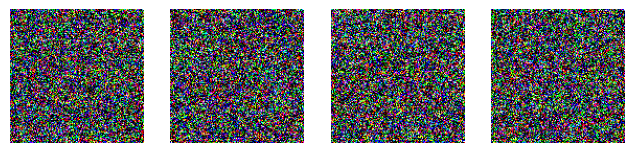

In [7]:
visualize_ddpm_generated_images(xt)

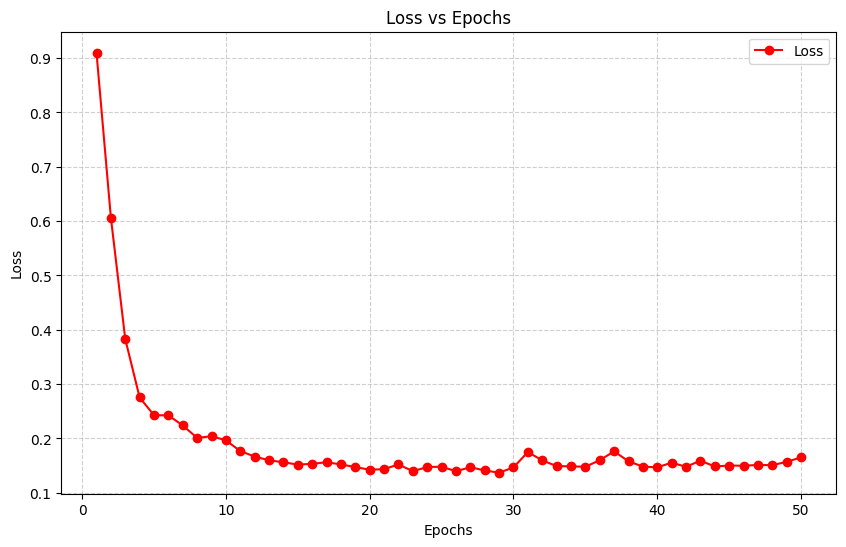

In [28]:
loss_file_path = "/home/siddharth/siddharth/ADRL/Assignment_3/loss/q1/loss.txt"
plot_loss_from_file(loss_file_path)

The Loss vs. Epochs plot shows a sharp drop in loss during the first 10 epochs, indicating that the model quickly learns the diffusion process in the early stages of training. After this, the loss stabilizes around 0.2, suggesting that the training process has converged and the model is performing consistently over the remaining epochs.

##### Try 2 (Architecture 1): 

   "num_epochs": 1000,

    "lr": 2e-4,
    
    "num_timesteps": 1000,
    
    "batch_size": 128,
    

In [19]:
test_cfg = {    
    'num_timesteps' :1000,
    'model_path' : '/home/siddharth/siddharth/ADRL/Assignment_3/models/q1/epoch_400/model.pth',
    'in_channels' : 3,
    'img_size' : 128,
    'num_img_to_generate' : 2,
    'batch_size' : 2,   
    'device':"cuda",
    'num_images': 16,

    # Diffusion parameters
    "beta_start": 1e-4,
    "beta_end": 0.01,

    }

generated_imgs = []
xt = generate(test_cfg)

/tmp/ipykernel_7446/3824153550.py:5: FutureWarning: You are using `torch.load` with `weights_only=False` (the current default value), which uses the default pickle module implicitly. It is possible to construct malicious pickle data which will execute arbitrary code during unpickling (See https://github.com/pytorch/pytorch/blob/main/SECURITY.md#untrusted-models for more details). In a future release, the default value for `weights_only` will be flipped to `True`. This limits the functions that could be executed during unpickling. Arbitrary objects will no longer be allowed to be loaded via this mode unless they are explicitly allowlisted by the user via `torch.serialization.add_safe_globals`. We recommend you start setting `weights_only=True` for any use case where you don't have full control of the loaded file. Please open an issue on GitHub for any issues related to this experimental feature.
  model = torch.load(cfg["model_path"]).to(device)
Generating Images: 100%|██████████| 1000/

16


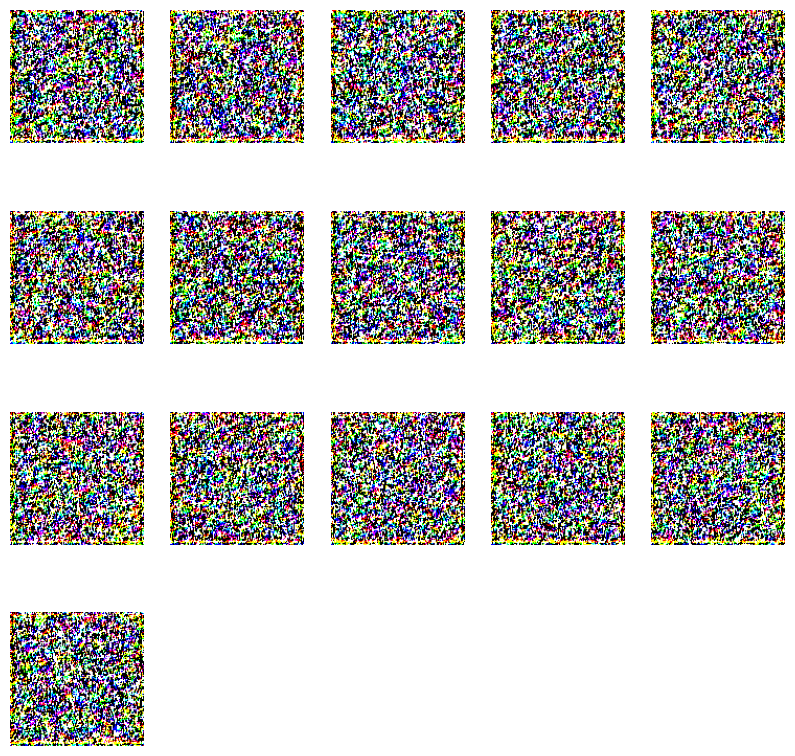

In [20]:
visualize_ddpm_generated_images(xt)

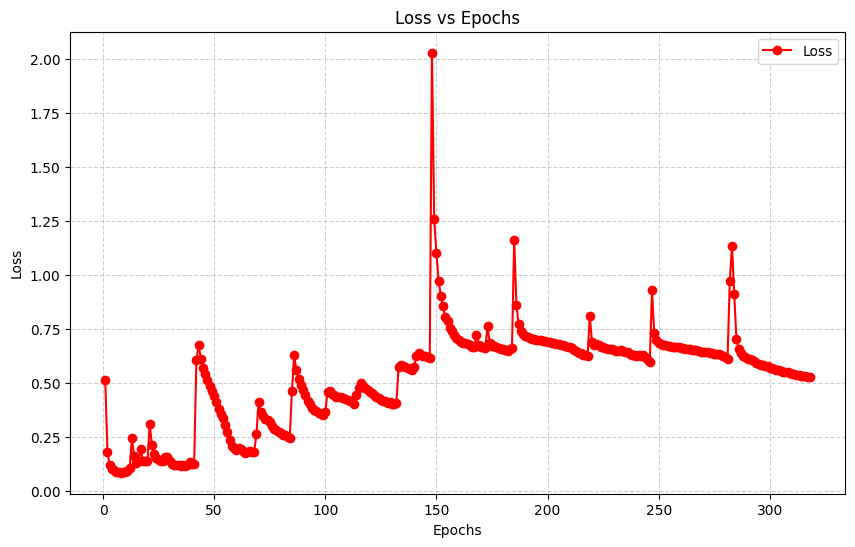

In [29]:
loss_file_path = "/home/siddharth/siddharth/ADRL/Assignment_3/loss/q1/loss1.txt"
plot_loss_from_file(loss_file_path)

##### Try 3: 

   "num_epochs":50,

    "lr": 2e-4,
    
    "num_timesteps": 1000,
    
    "batch_size": 128,
    

In [10]:
test_cfg = {    
    'num_timesteps' :1000,
    'model_path' : '/home/siddharth/siddharth/ADRL/Assignment_3/models/q1/try2/epoch_950/model.pth',
    'in_channels' : 3,
    'img_size' : 128,
    'num_images' : 20,   

    # Diffusion parameters
    "beta_start": 1e-4,
    "beta_end": 0.01,
    "device" : 'cuda'
    }

generated_imgs = []
generated_imgs = generate(test_cfg)

/tmp/ipykernel_7604/3824153550.py:5: FutureWarning: You are using `torch.load` with `weights_only=False` (the current default value), which uses the default pickle module implicitly. It is possible to construct malicious pickle data which will execute arbitrary code during unpickling (See https://github.com/pytorch/pytorch/blob/main/SECURITY.md#untrusted-models for more details). In a future release, the default value for `weights_only` will be flipped to `True`. This limits the functions that could be executed during unpickling. Arbitrary objects will no longer be allowed to be loaded via this mode unless they are explicitly allowlisted by the user via `torch.serialization.add_safe_globals`. We recommend you start setting `weights_only=True` for any use case where you don't have full control of the loaded file. Please open an issue on GitHub for any issues related to this experimental feature.
  model = torch.load(cfg["model_path"]).to(device)
Generating Images: 100%|██████████| 1000/

20


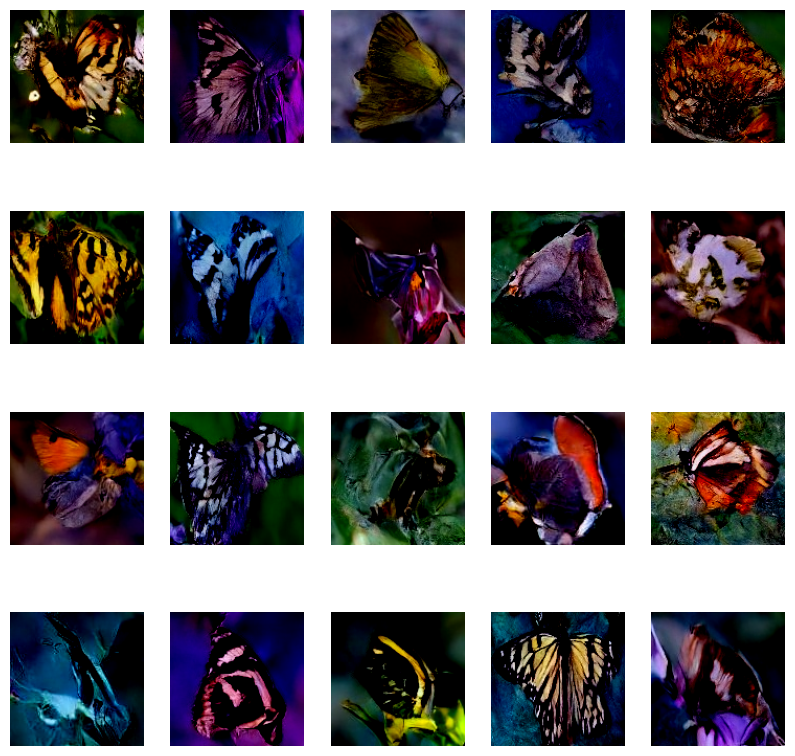

In [ ]:
visualize_ddpm_generated_images(generated_imgs, n_cols=5, figsize=(10, 10)) #epoch 950

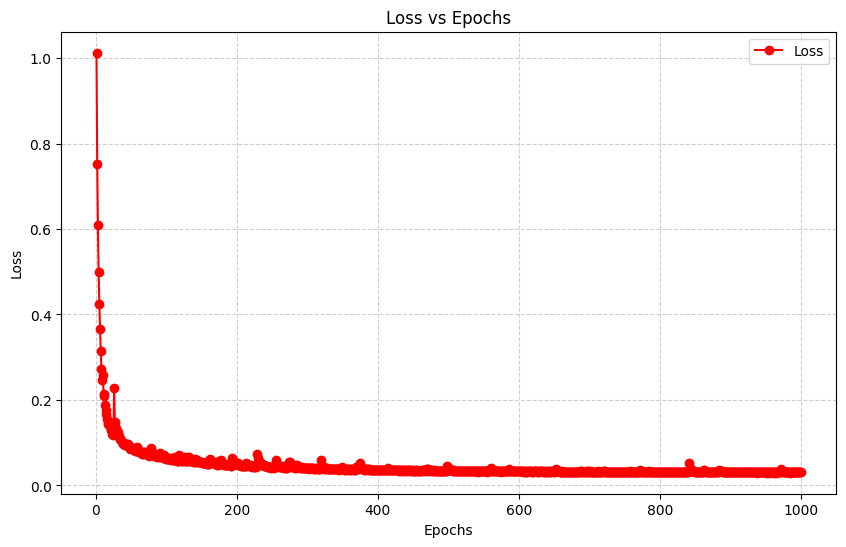

In [30]:
loss_file_path = "/home/siddharth/siddharth/ADRL/Assignment_3/loss/q1/loss3.txt"
plot_loss_from_file(loss_file_path)

#### Animals

##### Try 1 (Architecture 2):

In [12]:
test_cfg = {    
    'num_timesteps' :1000,
    'model_path' : '/home/siddharth/siddharth/ADRL/Assignment_3/models/q1/animals/epoch_990/model.pth',
    'in_channels' : 3,
    'img_size' : 128,
    'num_images' : 16,   

    # Diffusion parameters
    "beta_start": 1e-4,
    "beta_end": 0.01,
    "device" : 'cuda'
    }

generated_imgs = []
generated_imgs = generate(test_cfg)

/tmp/ipykernel_7604/3824153550.py:5: FutureWarning: You are using `torch.load` with `weights_only=False` (the current default value), which uses the default pickle module implicitly. It is possible to construct malicious pickle data which will execute arbitrary code during unpickling (See https://github.com/pytorch/pytorch/blob/main/SECURITY.md#untrusted-models for more details). In a future release, the default value for `weights_only` will be flipped to `True`. This limits the functions that could be executed during unpickling. Arbitrary objects will no longer be allowed to be loaded via this mode unless they are explicitly allowlisted by the user via `torch.serialization.add_safe_globals`. We recommend you start setting `weights_only=True` for any use case where you don't have full control of the loaded file. Please open an issue on GitHub for any issues related to this experimental feature.
  model = torch.load(cfg["model_path"]).to(device)
Generating Images: 100%|██████████| 1000/

16


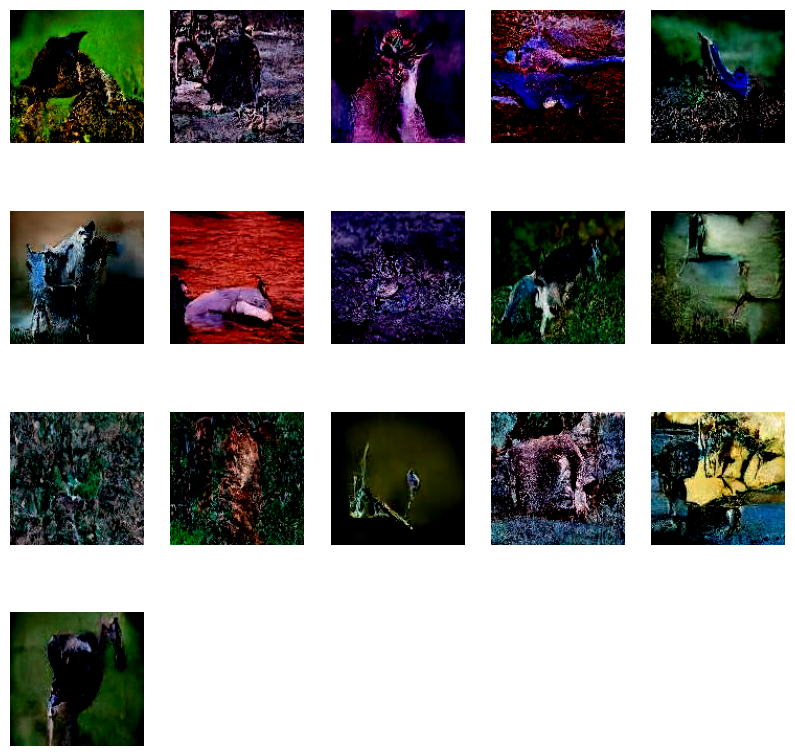

In [13]:
visualize_ddpm_generated_images(generated_imgs, n_cols=5, figsize=(10, 10)) 

In [ ]:
loss_file_path = "/home/siddharth/siddharth/ADRL/Assignment_3/loss/q1/animals1.txt"
plot_loss_from_file(loss_file_path)

### 5. FID (Q.3)

We calculated the Frechet Inception Distance (FID) between real and generated images. The FID computation involved extracting feature activations using a pre-trained InceptionV3 model and comparing the statistics (mean and covariance) of the real and generated image distributions. The FID scores were analyzed across different epochs, with the generated images obtained by iteratively reversing the diffusion process using the trained model. 

In [16]:
# fid score calculation
def calculate_fid(real_imgs, generated_imgs, batch_size = 32, device = 'cuda'):
    model = inception_v3(pretrained=True, transform_input=False).to(device)
    model.fc = nn.Identity()
    model.eval()
    act1 = get_activations(real_imgs, model, batch_size, device)
    act2 = get_activations(generated_imgs, model, batch_size, device)
    mu1, sigma1 = act1.mean(axis=0), np.cov(act1, rowvar=False)
    mu2, sigma2 = act2.mean(axis=0), np.cov(act2, rowvar=False)
    fid_score = calculate_frechet_distance(mu1, sigma1, mu2, sigma2)
    return fid_score

def get_activations(imgs, model, batch_size, device):
    dataLoader = DataLoader(imgs, batch_size=batch_size, shuffle=False)
    activations = []
    with torch.no_grad():
      for batch in dataLoader:
        batch = batch.to(device)
        pred = model(batch)
        activations.append(pred.cpu().numpy())
    activations = np.concatenate(activations, axis=0)   
    return activations

def preprocess_images(images, image_size=(299, 299)):
    preprocess = transforms.Compose([
        transforms.Resize(image_size),
        transforms.Lambda(lambda x: (x + 1) / 2), 
        transforms.Normalize(mean=[0.485, 0.456, 0.406], std=[0.229, 0.224, 0.225]),
    ])
    processed_images = [preprocess(img) for img in images]
    return torch.stack(processed_images)

def calculate_frechet_distance(mu1, sigma1, mu2, sigma2):
    diff = mu1 - mu2
    covmean, _ = linalg.sqrtm(sigma1.dot(sigma2), disp=False)
    if np.iscomplexobj(covmean):
        covmean = covmean.real
    fid = diff.dot(diff) + np.trace(sigma1 + sigma2 - 2 * covmean)
    return fid


def generate(cfg):  
    device = torch.device('cuda' if torch.cuda.is_available() else 'cpu')
    drp = reverse_diff(cfg)
    model = torch.load(cfg["model_path"]).to(device)
    model.eval()

    xt = torch.randn(cfg["batch_size"], cfg["in_channels"], cfg["img_size"], cfg["img_size"]).to(device)

    with torch.no_grad():
        for t in tqdm(reversed(range(cfg["num_timesteps"])), desc="Generating Images", unit="timestep", total = cfg["num_timesteps"]):
            noise_pred = model(xt, torch.as_tensor(t).unsqueeze(0).to(device))   
            xt, x0 = drp.sample_q(xt, noise_pred, torch.as_tensor(t).to(device))
    
    xt = torch.clamp(xt, -1., 1.).detach().cpu()
    # xt = torch.tanh(xt).cpu().detach()
    return xt

def compute_fid(cfg):

    batch_size  = cfg["batch_size"]
    data_loc = cfg["data_loc"]
    device = cfg["device"]
    
    test_dataset = ButterflyDataset(data_loc)
    dataloader = DataLoader(test_dataset, batch_size=32, shuffle=False)

    real_imgs = []
    for imgs, _ in dataloader:
       real_imgs.append(imgs)

    real_imgs = torch.cat(real_imgs, dim=0).to(device)

    generated_imgs = generate(cfg)  
   
    real_imgs = preprocess_images(real_imgs)
    generated_imgs = preprocess_images(generated_imgs)

    fid_score = calculate_fid(real_imgs, generated_imgs, batch_size, device)    
    return fid_score

In [17]:
fid_cfg = {
    'data_loc' : data_folder_aug_butterfly,
    'batch_size' : 10,
    'device' : 'cuda',
    'num_timesteps' : 1000,
    'model_path' : '/home/siddharth/siddharth/ADRL/Assignment_3/models/q1/try2/epoch_950/model.pth',
    'in_channels' : 3,
    'img_size' : 128,

    "beta_start": 1e-4,
    "beta_end": 0.01,
}

In [18]:
output_file = "/home/siddharth/siddharth/ADRL/Assignment_3/FIDs/fid_results.txt"

In [ ]:
with open(output_file, "w") as f:
    f.write("Epoch\tFID\n")  
    for epoch in range(510, 991, 10):
        model_path = f"/home/siddharth/siddharth/ADRL/Assignment_3/models/q1/try2/epoch_{epoch}/model.pth"
        fid_cfg['model_path'] = model_path
        if not os.path.exists(model_path):
            print(f"Model not found: {model_path}")
            continue
        
        fid = compute_fid(fid_cfg)
        
        f.write(f"{epoch}\t{fid}\n")
        f.flush()
        print(f"FID for epoch {epoch}: {fid}")

#### FID Butterfly

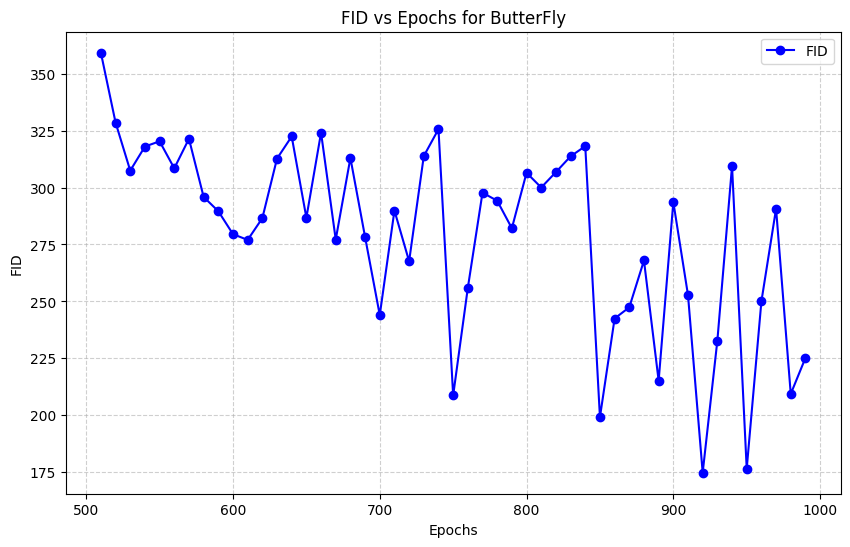

In [19]:
def plot_fid_from_file(fid_file_path, output_image_path=None):
    epochs = []
    fid_values = []

    # Read data from file
    with open(fid_file_path, "r") as f:
        # Skip the header line
        next(f)
        for line in f:
            epoch, fid = line.strip().split("\t")
            epochs.append(int(epoch))
            fid_values.append(float(fid))
    
    # Plotting
    plt.figure(figsize=(10, 6))
    plt.plot(epochs, fid_values, marker="o", linestyle="-", color="blue", label="FID")
    plt.title("FID vs Epochs for ButterFly")
    plt.xlabel("Epochs")
    plt.ylabel("FID")
    plt.grid(True, linestyle="--", alpha=0.6)
    plt.legend()
    
    # Save or show the plot
    if output_image_path:
        plt.savefig(output_image_path)
        print(f"Plot saved to {output_image_path}")
    else:
        plt.show()
        
plot_fid_from_file(output_file)

The FID vs. Epochs plot for the Butterfly dataset shows a gradual improvement in FID scores as training progresses, with fluctuations observed after 700 epochs. This indicates that while the model generally improves in generating more realistic images over time, some variability in performance persists across epochs.

#### FID Animals

In [ ]:
output_file = "/home/siddharth/siddharth/ADRL/Assignment_3/FIDs/fid_results_animals.txt"

with open(output_file, "w") as f:
    f.write("Epoch\tFID\n")  
    for epoch in range(0, 991, 10):
        model_path = f"/home/siddharth/siddharth/ADRL/Assignment_3/models/q1/animals/epoch_{epoch}/model.pth"
        fid_cfg['model_path'] = model_path
        if not os.path.exists(model_path):
            print(f"Model not found: {model_path}")
            continue
        
        fid = compute_fid(fid_cfg)
        
        f.write(f"{epoch}\t{fid}\n")
        f.flush()
        print(f"FID for epoch {epoch}: {fid}")
    

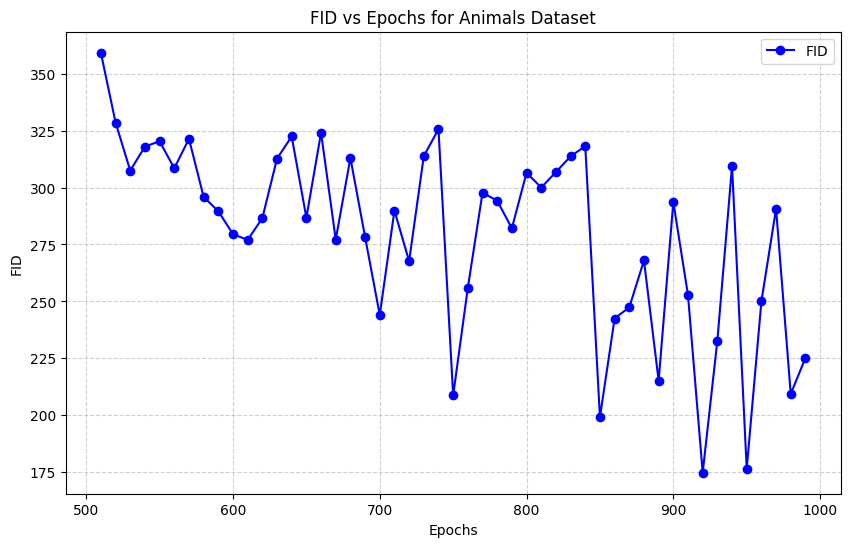

In [20]:
def plot_fid_from_file(fid_file_path, output_image_path=None):
    epochs = []
    fid_values = []

    with open(fid_file_path, "r") as f:
        next(f)
        for line in f:
            epoch, fid = line.strip().split("\t")
            epochs.append(int(epoch))
            fid_values.append(float(fid))
    
    # Plotting
    plt.figure(figsize=(10, 6))
    plt.plot(epochs, fid_values, marker="o", linestyle="-", color="blue", label="FID")
    plt.title("FID vs Epochs for Animals Dataset")
    plt.xlabel("Epochs")
    plt.ylabel("FID")
    plt.grid(True, linestyle="--", alpha=0.6)
    plt.legend()
    
    # Save or show the plot
    if output_image_path:
        plt.savefig(output_image_path)
        print(f"Plot saved to {output_image_path}")
    else:
        plt.show()
        
plot_fid_from_file(output_file)

The FID vs. Epochs plot for the Animals dataset shows an overall decreasing trend in FID scores as training progresses, indicating an improvement in the quality of generated images. Despite this, the plot exhibits significant fluctuations, particularly after 700 epochs, suggesting some inconsistency in the model's performance during later stages of training.

### 6. DDPM-VQVAE (Q.4)

#### VQ-VAE Architechture

 We trained a DDPM on the latent space of the VQ-VAE model, which was trained in the previous assignment. By operating in the latent space, the model significantly reduced computational complexity.

In [21]:
class ResidualLayer(nn.Module):
    def __init__(self, in_channels, out_channels):
        super(ResidualLayer, self).__init__()
        self.block = nn.Sequential(
            nn.ReLU(),
            nn.Conv2d(in_channels, out_channels, kernel_size=3, stride=1, padding=1),
            nn.ReLU(),
            nn.Conv2d(out_channels, in_channels, kernel_size=1, stride=1)
        )
    
    def forward(self, x):
        return x + self.block(x)

class ResidualStack(nn.Module):
    def __init__(self, in_channels, res_channels, n_res_layers):
        super(ResidualStack, self).__init__()
        self.layers = nn.ModuleList([ResidualLayer(in_channels, res_channels) for _ in range(n_res_layers)])
    
    def forward(self, x):
        for layer in self.layers:
            x = layer(x)
        return F.relu(x)

class Encoder(nn.Module):
    def __init__(self, in_channels, h_dim, n_res_layers, res_h_dim):
        super(Encoder, self).__init__()
        self.conv1 = nn.Conv2d(in_channels, h_dim // 2, kernel_size=4, stride=2, padding=1)
        self.conv2 = nn.Conv2d(h_dim // 2, h_dim, kernel_size=4, stride=2, padding=1)
        self.conv3 = nn.Conv2d(h_dim, h_dim, kernel_size=3, stride=1, padding=1)
        self.res_stack = ResidualStack(h_dim, res_h_dim, n_res_layers)
    
    def forward(self, x):
        x = F.relu(self.conv1(x))
        x = F.relu(self.conv2(x))
        x = self.conv3(x)
        return self.res_stack(x)

class Decoder(nn.Module):
    def __init__(self, h_dim, n_res_layers, res_h_dim, out_channels):
        super(Decoder, self).__init__()
        self.res_stack = ResidualStack(h_dim, res_h_dim, n_res_layers)
        self.conv1 = nn.ConvTranspose2d(h_dim, h_dim // 2, kernel_size=4, stride=2, padding=1)
        self.conv2 = nn.ConvTranspose2d(h_dim // 2, out_channels, kernel_size=4, stride=2, padding=1)
    
    def forward(self, x):
        x = self.res_stack(x)
        x = F.relu(self.conv1(x))
        return torch.sigmoid(self.conv2(x))

class VectorQuantizer(nn.Module):
    def __init__(self, n_embeddings, embedding_dim, beta):
        super(VectorQuantizer, self).__init__()
        self.embedding_dim = embedding_dim
        self.n_embeddings = n_embeddings
        self.beta = beta
        
        self.embeddings = nn.Embedding(n_embeddings, embedding_dim)
        self.embeddings.weight.data.uniform_(-1/self.n_embeddings, 1/self.n_embeddings)

    def forward(self, z):
        z_flattened = z.view(-1, self.embedding_dim)
        
        # Compute distances between z and embedding vectors
        distances = torch.sum(z_flattened ** 2, dim=1, keepdim=True) + \
                    torch.sum(self.embeddings.weight ** 2, dim=1) - \
                    2 * torch.matmul(z_flattened, self.embeddings.weight.t())
        
        # Get the closest embedding for each element in z
        indices = torch.argmin(distances, dim=1).unsqueeze(1)
        z_q = torch.index_select(self.embeddings.weight, dim=0, index=indices.view(-1))
        z_q = z_q.view(z.shape)
        
        # Compute loss
        embedding_loss = F.mse_loss(z_q.detach(), z) + self.beta * F.mse_loss(z_q, z.detach())
        z_q = z + (z_q - z).detach() 
        
        return z_q, embedding_loss

class VQVAE(nn.Module):
    def __init__(self, in_channels, h_dim, n_res_layers, res_h_dim, n_embeddings, embedding_dim, beta):
        super(VQVAE, self).__init__()
        self.encoder = Encoder(in_channels, h_dim, n_res_layers, res_h_dim)
        self.quantizer = VectorQuantizer(n_embeddings, embedding_dim, beta)
        self.decoder = Decoder(h_dim, n_res_layers, res_h_dim, in_channels)

    def forward(self, x):
        z_e = self.encoder(x)
        z_q, loss = self.quantizer(z_e)
        x_recon = self.decoder(z_q)
        return x_recon, loss


In [22]:
def get_latents(kwargs):
    model_path = kwargs["model_path"]
    data_path = kwargs["data_path"]
    batch_size = kwargs["batch_size"]
    device = kwargs["device"]
    model = torch.load(model_path)
    model.eval()
    labels=[]
    latents = []
    
    data = ButterflyDataset(data_path)
    data_loader = DataLoader(data, batch_size=batch_size, shuffle=True)
    
    with torch.no_grad():
        for batch,label in data_loader:
            inputs = batch.to(device)
            z_e = model.encoder(inputs)
            z_q,_ = model.quantizer(z_e)
            latents.append(z_q.cpu())
            labels.append(label.cpu())
    
    latents = torch.cat(latents, dim = 0)
    labels = torch.cat(labels, dim=0)
    latent_dataset = TensorDataset(latents, labels)
    
    return latent_dataset                 

In [54]:
kwargs = {
    "model_path" : "/home/siddharth/siddharth/ADRL/Assignment_2/Models/q7_vqvae/vq_vae_99.pth",
    "data_path" : data_folder_aug_butterfly,
    "batch_size": 64,
    "device" : "cuda",
}
latent_data = get_latents(kwargs)
torch.save(latent_data,"/home/siddharth/siddharth/ADRL/Data/vqvae_latent_data/latent_dataset.pt")

/tmp/ipykernel_7604/1210682656.py:6: FutureWarning: You are using `torch.load` with `weights_only=False` (the current default value), which uses the default pickle module implicitly. It is possible to construct malicious pickle data which will execute arbitrary code during unpickling (See https://github.com/pytorch/pytorch/blob/main/SECURITY.md#untrusted-models for more details). In a future release, the default value for `weights_only` will be flipped to `True`. This limits the functions that could be executed during unpickling. Arbitrary objects will no longer be allowed to be loaded via this mode unless they are explicitly allowlisted by the user via `torch.serialization.add_safe_globals`. We recommend you start setting `weights_only=True` for any use case where you don't have full control of the loaded file. Please open an issue on GitHub for any issues related to this experimental feature.
  model = torch.load(model_path)


In [56]:
# latent_data = torch.load(vqvae_cfg["train_data_path"])
latents,labels = latent_data[:]
latents.shape

torch.Size([12998, 256, 32, 32])

In [61]:
def train_latents(cfg):
    model_save_path = cfg["model_save_path"]
    latent_data_path = cfg["train_data_path"]  # Path to the .pt file containing latent data
    num_epochs = cfg["num_epochs"]
    lr = cfg["lr"]
    num_timesteps = cfg["num_timesteps"]
    bs = cfg["batch_size"]
    device = cfg["device"]
    loss_file_path = cfg["loss_file_path"]
    load_model = cfg.get("load_model", False)
    model_load_path = cfg.get("load_model_path", None)

    # Load VQ-VAE latents
    latents = torch.load(latent_data_path)  # Shape: [12998, 256, 32, 32]
    # latent_dataset = TensorDataset(latents)
    train_loader = DataLoader(latents, batch_size=bs, shuffle=True)

    # Initialize or load model
    if load_model and model_load_path:
        if os.path.exists(model_load_path):
            model = torch.load(model_load_path).to(device)
            print(f"Loaded model from {model_load_path}")
        else:
            print(f"Model load path {model_load_path} not found. Starting training from scratch.")
            model = Unet(cfg).to(device)
    else:
        print("Starting training from scratch.")
        model = Unet(cfg).to(device)

    optimizer = torch.optim.Adam(model.parameters(), lr=lr)
    criterion = torch.nn.MSELoss()
    dfp = forward_diff(cfg)

    with open(loss_file_path, "w") as f:
        f.write("epoch,loss\n")

    # Training loop
    for epoch in range(num_epochs):
        losses = []
        model.train()

        with tqdm(train_loader, desc=f"Epoch {epoch+1}/{num_epochs}", unit="batch") as pbar:
            for latents_batch,label in pbar:
                latents_batch = latents_batch.to(device)  # Extract the latent tensor
                # print("latent_batch",latents_batch.shape)
                
                noise = torch.randn_like(latents_batch).to(device)
                t = torch.randint(0, num_timesteps, (latents_batch.shape[0],)).to(device)
                
                noisy_latents = dfp.add_noise(latents_batch, noise, t)
                # print("noisy latents shape",noisy_latents.shape)

                optimizer.zero_grad()
                noise_pred = model(noisy_latents, t)
                loss = criterion(noise_pred, noise)

                losses.append(loss.item())
                loss.backward()
                optimizer.step()

                mean_loss = np.mean(losses)
                pbar.set_postfix(loss=mean_loss)

        print(f"Epoch {epoch+1}/{num_epochs}, Loss: {mean_loss:.4f}")

        with open(loss_file_path, "a") as f:
            f.write(f"{epoch+1},{mean_loss}\n")

        if epoch % 10 == 0:
            # Define model save path inside this epoch directory
            epoch_dir = os.path.join(model_save_path, f"epoch_{epoch}")
            os.makedirs(epoch_dir, exist_ok=True)

            save_path = os.path.join(epoch_dir, "model.pth")
            torch.save(model, save_path)
            print(f"Model saved at {save_path}")


In [65]:
vqvae_cfg = {
    "model_save_path": '/home/siddharth/siddharth/ADRL/Assignment_3/models/q4',
    "train_data_path": '/home/siddharth/siddharth/ADRL/Data/vqvae_latent_data/latent_dataset.pt',
    "num_epochs": 50,
    "lr": 1e-3,
    "num_timesteps": 1000,
    "batch_size": 4,
    "device":"cuda",
    "loss_file_path": '/home/siddharth/siddharth/ADRL/Assignment_3/loss/q4/vqvae_loss.txt',

    # Unet parameters   
    "im_channels": 256,
    "down_ch": [32, 64, 128, 256],
    "mid_ch": [256, 256, 128],
    "up_ch": [256, 128, 64, 16],
    "down_sample": [True, True, False],
    "t_emb_dim": 128,
    "num_downc_layers": 2,
    "num_midc_layers": 2,
    "num_upc_layers": 2,

    # Diffusion parameters
    "beta_start": 1e-4,
    "beta_end": 0.01,

    # Attention parameters
    "add_attn_down": True,
    "add_attn_mid": True,
    "add_attn_up": True,
}

In [66]:
train_latents(vqvae_cfg)

/tmp/ipykernel_7604/1032786130.py:14: FutureWarning: You are using `torch.load` with `weights_only=False` (the current default value), which uses the default pickle module implicitly. It is possible to construct malicious pickle data which will execute arbitrary code during unpickling (See https://github.com/pytorch/pytorch/blob/main/SECURITY.md#untrusted-models for more details). In a future release, the default value for `weights_only` will be flipped to `True`. This limits the functions that could be executed during unpickling. Arbitrary objects will no longer be allowed to be loaded via this mode unless they are explicitly allowlisted by the user via `torch.serialization.add_safe_globals`. We recommend you start setting `weights_only=True` for any use case where you don't have full control of the loaded file. Please open an issue on GitHub for any issues related to this experimental feature.
  latents = torch.load(latent_data_path)  # Shape: [12998, 256, 32, 32]


Starting training from scratch.


Epoch 1/50:  23%|██▎       | 747/3250 [00:16<00:56, 44.69batch/s, loss=0.997]


KeyboardInterrupt: 

#### Images

In [6]:
def get_latents_from_ddpm_and_plot(cfg):  
    device = cfg['device']
    drp = reverse_diff(cfg)

    model = torch.load(cfg["model_path"]).to(device)
    model.eval()
    
    xt = torch.randn(cfg["num_latents"], cfg["in_channels"], cfg["img_size"], cfg["img_size"]).to(device)
    
    with torch.no_grad():
        for t in tqdm(reversed(range(cfg["num_timesteps"])), desc="Generating Latents", unit="timestep", total = cfg["num_timesteps"]):
            noise_pred = model(xt, torch.as_tensor(t).unsqueeze(0).to(device))   
            xt, x0 = drp.sample_q(xt, noise_pred, torch.as_tensor(t).to(device))
    
    print("Latents generated Successfully from ddpm")        
    print("The shape of generated latents is: ", xt.shape)
    generate_images_from_latents(xt, cfg)
    # return xt

def plot_generated_images(images, num_images=100):
    print("Plotting Images")
    images = images.cpu().detach()
    grid_size = int(np.sqrt(num_images))  # Assuming num_images is a perfect square like 100
    fig, axes = plt.subplots(grid_size, grid_size, figsize=(15, 15))

    for i in range(num_images):
        row = i // grid_size
        col = i % grid_size
        ax = axes[row, col]
        img_to_show = images[i].permute(1, 2, 0).numpy()
        img_to_show = (img_to_show + 1) * 127.5
        img_to_show = img_to_show.astype(np.uint8)
        ax.imshow(img_to_show)
        ax.axis('off')

    plt.subplots_adjust(wspace=0.1, hspace=0.1)
    plt.show()

# Function to generate images from latents using VQ-VAE decoder
def generate_images_from_latents(latents, cfg):
    vqvae_model = torch.load(cfg["vqvae_model_path"])
    vqvae_model.eval()
    latents = latents.to(cfg["device"])
    with torch.no_grad():
        generated_imgs = vqvae_model.decoder(latents)
    
    print("Image Generation Done!!")    
    
    plot_generated_images(generated_imgs, num_images=cfg["num_latents"])
    # return generated_imgs

vqvae_test_cfg = {    
    'num_timesteps' :1000,
    'model_path' : '/home/siddharth/siddharth/ADRL/Assignment_3/models/q4/epoch_10/model.pth',
    'num_latents' : 16,   
    'device' : 'cuda',
    
    # Diffusion parameters
    "beta_start": 1e-4,
    "beta_end": 0.01,
    "in_channels": 256,
    "img_size":32,
    
    "vqvae_model_path": "/home/siddharth/siddharth/ADRL/Assignment_2/Models/q7_vqvae/vq_vae_99.pth"
    }

/tmp/ipykernel_14021/3305670471.py:5: FutureWarning: You are using `torch.load` with `weights_only=False` (the current default value), which uses the default pickle module implicitly. It is possible to construct malicious pickle data which will execute arbitrary code during unpickling (See https://github.com/pytorch/pytorch/blob/main/SECURITY.md#untrusted-models for more details). In a future release, the default value for `weights_only` will be flipped to `True`. This limits the functions that could be executed during unpickling. Arbitrary objects will no longer be allowed to be loaded via this mode unless they are explicitly allowlisted by the user via `torch.serialization.add_safe_globals`. We recommend you start setting `weights_only=True` for any use case where you don't have full control of the loaded file. Please open an issue on GitHub for any issues related to this experimental feature.
  model = torch.load(cfg["model_path"]).to(device)
Generating Latents: 100%|██████████| 100

Latents generated Successfully from ddpm
The shape of generated latents is:  torch.Size([16, 256, 32, 32])
Image Generation Done!!
Plotting Images


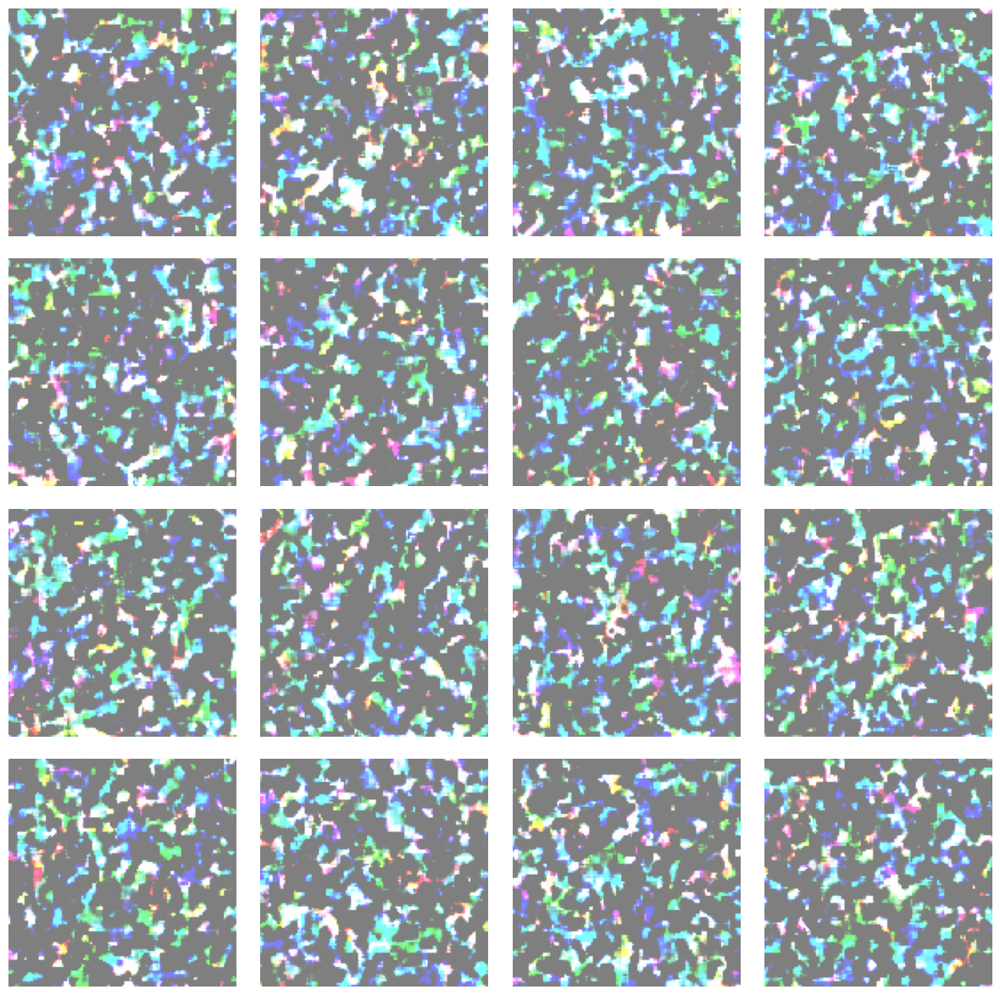

In [9]:
get_latents_from_ddpm_and_plot(vqvae_test_cfg)

#### Losses

In [40]:
def plot_loss_from_file(loss_file_path, output_image_path=None):
    epochs = []
    losses = []

    # Read data from file
    with open(loss_file_path, "r") as f:
        # Skip the header line
        next(f)
        for line in f:
            epoch, loss = line.strip().split(",")
            epochs.append(int(epoch))
            losses.append(float(loss))
    
    # Plotting
    plt.figure(figsize=(10, 6))
    plt.plot(epochs, losses, marker="o", linestyle="-", color="red", label="Loss")
    plt.title("Loss vs Epochs")
    plt.xlabel("Epochs")
    plt.ylabel("Loss")
    plt.grid(True, linestyle="--", alpha=0.6)
    plt.legend()
    
    # Save or show the plot
    if output_image_path:
        plt.savefig(output_image_path)
        print(f"Plot saved to {output_image_path}")
    else:
        plt.show()

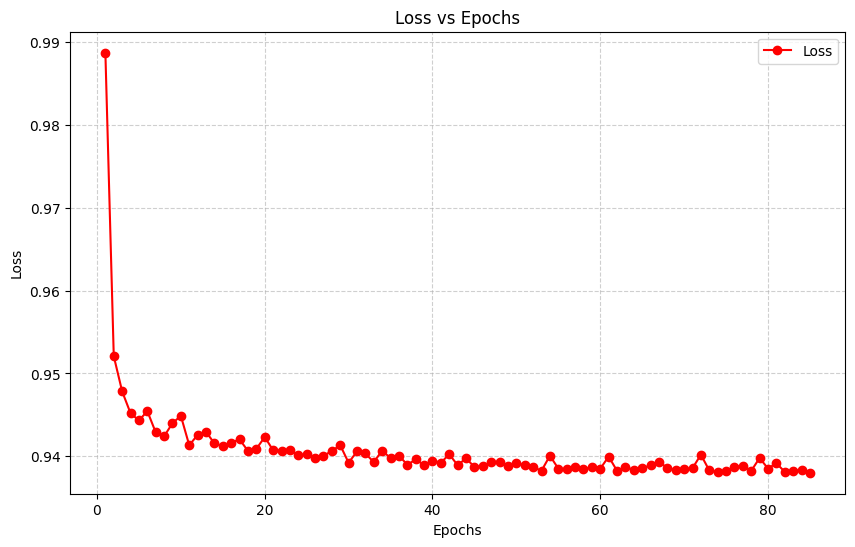

In [41]:
loss_file_path = "/home/siddharth/siddharth/ADRL/Assignment_3/loss/q4/loss1.txt"
plot_loss_from_file(loss_file_path)

#### FIDs

In [19]:
# fid score calculation
def calculate_fid(real_imgs, generated_imgs, batch_size = 32, device = 'cpu'):
    model = inception_v3(pretrained=True, transform_input=False).to(device)
    model.fc = nn.Identity()
    model.eval()
    act1 = get_activations(real_imgs, model, batch_size, device)
    act2 = get_activations(generated_imgs, model, batch_size, device)
    mu1, sigma1 = act1.mean(axis=0), np.cov(act1, rowvar=False)
    mu2, sigma2 = act2.mean(axis=0), np.cov(act2, rowvar=False)
    fid_score = calculate_frechet_distance(mu1, sigma1, mu2, sigma2)
    return fid_score

def get_activations(imgs, model, batch_size, device):
    dataLoader = DataLoader(imgs, batch_size=batch_size, shuffle=False)
    activations = []

    with torch.no_grad():
      for batch in dataLoader:
        batch = batch.to(device)
        pred = model(batch)
        activations.append(pred.cpu().numpy())
    activations = np.concatenate(activations, axis=0)   
    return activations

def preprocess_images(images, image_size=(299, 299)):
    preprocess = transforms.Compose([
        transforms.Resize(image_size),
        transforms.Lambda(lambda x: (x + 1) / 2), 
        transforms.Normalize(mean=[0.485, 0.456, 0.406], std=[0.229, 0.224, 0.225]),
    ])
    processed_images = [preprocess(img) for img in images]
    return torch.stack(processed_images)

def calculate_frechet_distance(mu1, sigma1, mu2, sigma2):
    diff = mu1 - mu2
    covmean, _ = linalg.sqrtm(sigma1.dot(sigma2), disp=False)
    if np.iscomplexobj(covmean):
        covmean = covmean.real
    fid = diff.dot(diff) + np.trace(sigma1 + sigma2 - 2 * covmean)
    
    return fid

# Function to generate images from latents using VQ-VAE decoder
def generate_images_from_latents(latents, cfg):
    vqvae_model = torch.load(cfg["vqvae_model_path"])
    vqvae_model.eval()
    latents = latents.to(cfg["device"])
    with torch.no_grad():
        generated_imgs = vqvae_model.decoder(latents)
    
    print("Image Generation Done!!")    
    # plot_generated_images(generated_imgs, num_images=cfg["num_latents"])
    return generated_imgs
    
def get_latents_from_ddpm(cfg):  
    device = cfg["device"]
    drp = reverse_diff(cfg)
    model = torch.load(cfg["model_path"]).to(device)
    model.eval()
    xt = torch.randn(cfg["num_images"], cfg["in_channels"], cfg["img_size"], cfg["img_size"]).to(device)

    with torch.no_grad():
        for t in tqdm(reversed(range(cfg["num_timesteps"])), desc="Generating Images", unit="timestep", total = cfg["num_timesteps"]):
            noise_pred = model(xt, torch.as_tensor(t).unsqueeze(0).to(device))   
            xt, x0 = drp.sample_q(xt, noise_pred, torch.as_tensor(t).to(device))
    
    xt = torch.clamp(xt, -1., 1.).detach().cpu()
    # xt = torch.tanh(xt).cpu().detach()
    
    print("Latents generated Successfully")        
    
    return generate_images_from_latents(xt, cfg)


def compute_fid_vqvae(cfg):

    batch_size  = cfg["num_images"]
    data_loc = cfg["data_loc"]
    device = cfg["device"]
    
    test_dataset = ButterflyDataset(data_loc)
    dataloader = DataLoader(test_dataset, batch_size=32, shuffle=False)

    real_imgs = []
    for imgs, _ in dataloader:
       real_imgs.append(imgs)

    real_imgs = torch.cat(real_imgs, dim=0).to(device)

    generated_imgs = get_latents_from_ddpm(cfg)  
   
    real_imgs = preprocess_images(real_imgs)
    generated_imgs = preprocess_images(generated_imgs)

    fid_score = calculate_fid(real_imgs, generated_imgs, batch_size, device)    
    return fid_score


In [46]:
fid_cfg = {
    'data_loc' : data_folder_aug_butterfly,
    'num_images' : 1,
    'device' : 'cuda',
    'num_timesteps' : 1000,
    'model_path' : "/home/siddharth/siddharth/ADRL/Assignment_3/models/q7/test_model.pth",
    "vqvae_model_path": "/home/siddharth/siddharth/ADRL/Assignment_2/Models/q7_vqvae/vq_vae_99.pth",
    
    "batch_size" : 8,
    'in_channels' : 256,
    'img_size' : 32,

    "beta_start": 1e-4,
    "beta_end": 0.01,
}

In [44]:
output_file = "/home/siddharth/siddharth/ADRL/Assignment_3/FIDs/q4_fid_result.txt"

In [ ]:
with open(output_file, "w") as f:
    f.write("Epoch\tFID\n")  
    for epoch in range(0, 81, 10):
        model_path = f"/home/siddharth/siddharth/ADRL/Assignment_3/models/q4/epoch_{epoch}/model.pth"
        fid_cfg['model_path'] = model_path
        if not os.path.exists(model_path):
            print(f"Model not found: {model_path}")
            continue
        
        fid = compute_fid_vqvae(fid_cfg)
        
        f.write(f"{epoch}\t{fid}\n")
        f.flush()
        print(f"FID for epoch {epoch}: {fid}")

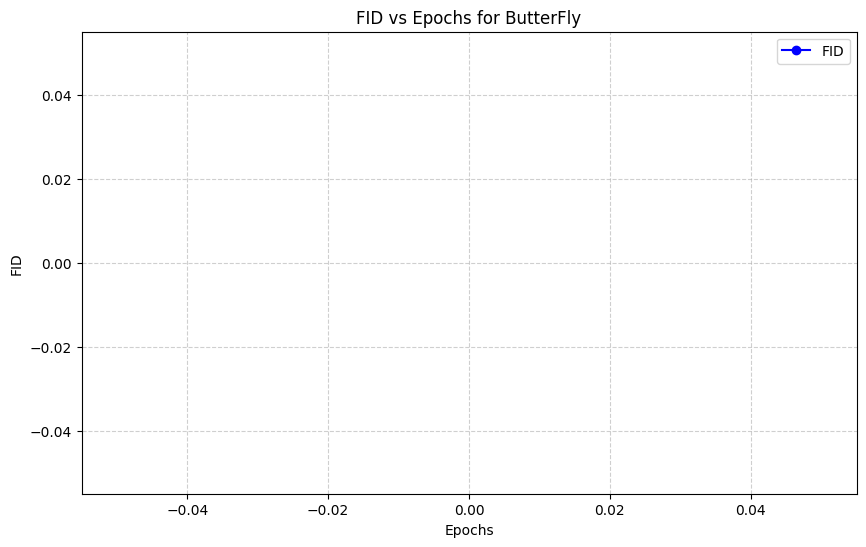

In [48]:
def plot_fid_from_file(fid_file_path, output_image_path=None):
    epochs = []
    fid_values = []

    # Read data from file
    with open(fid_file_path, "r") as f:
        # Skip the header line
        next(f)
        for line in f:
            epoch, fid = line.strip().split("\t")
            epochs.append(int(epoch))
            fid_values.append(float(fid))
    
    # Plotting
    plt.figure(figsize=(10, 6))
    plt.plot(epochs, fid_values, marker="o", linestyle="-", color="blue", label="FID")
    plt.title("FID vs Epochs for ButterFly")
    plt.xlabel("Epochs")
    plt.ylabel("FID")
    plt.grid(True, linestyle="--", alpha=0.6)
    plt.legend()
    
    # Save or show the plot
    if output_image_path:
        plt.savefig(output_image_path)
        print(f"Plot saved to {output_image_path}")
    else:
        plt.show()
        
plot_fid_from_file(output_file)

### 7. CLASSIFIER GUIDED DDPM (Q.5)

Conditional generation was achieved using classifier-guided diffusion, where a pre-trained classifier provided gradients to guide the reverse diffusion process towards a specified class. The DDPM model utilized these classifier-based adjustments during sampling to generate class-specific images, which were visualized to assess their quality and relevance to the target class.

In [17]:
dataset = ButterflyDataset(data_folder_aug_butterfly)
print(f'Number of classes in training data: {len(dataset.label_map)}')

Number of classes in training data: 75


In [18]:
classifier_model_butterfly = models.resnet50(pretrained=True)
classifier_model_butterfly.fc = nn.Linear(classifier_model_butterfly.fc.in_features, 75)

/home/siddharth/anaconda3/envs/adrl/lib/python3.9/site-packages/torchvision/models/_utils.py:208: UserWarning: The parameter 'pretrained' is deprecated since 0.13 and may be removed in the future, please use 'weights' instead.
  warnings.warn(
/home/siddharth/anaconda3/envs/adrl/lib/python3.9/site-packages/torchvision/models/_utils.py:223: UserWarning: Arguments other than a weight enum or `None` for 'weights' are deprecated since 0.13 and may be removed in the future. The current behavior is equivalent to passing `weights=ResNet50_Weights.IMAGENET1K_V1`. You can also use `weights=ResNet50_Weights.DEFAULT` to get the most up-to-date weights.
  warnings.warn(msg)


In [23]:
#Train test val split of 80, 10, 10
train_size = int(0.8 * len(dataset))
val_size = int(0.1 * len(dataset))
test_size = len(dataset) - train_size - val_size
train_dataset, val_dataset, test_dataset = torch.utils.data.random_split(dataset, [train_size, val_size, test_size])
print(f"Train size: {len(train_dataset)}, Val size: {len(val_dataset)}, Test size: {len(test_dataset)}")

Train size: 10398, Val size: 1299, Test size: 1301


In [20]:
def add_noise_fd(images, T=1000, device='cuda'):
        # Test
    original = images
    noise = torch.randn(images.shape).to(device)
    t_steps = torch.randint(0, T, (images.shape[0],)).to(device) 
    dfp = forward_diff()
    dfp = dfp.to(device)
    out = dfp.add_noise(original, noise, t_steps)
    return out
    

In [ ]:

class ReverseDiffClassifierGuided(nn.Module):
    def __init__(self, classifier_model, num_time_steps=1000, beta_start=0.0001, beta_end=0.02, guidance_scale=1.0):
        super(ReverseDiffClassifierGuided, self).__init__()
        # Initialize betas, alphas, and cumulative products
        self.betas = torch.linspace(beta_start, beta_end, num_time_steps)
        self.alphas = 1.0 - self.betas
        self.alphas_cumprod = torch.cumprod(self.alphas, dim=0)
        self.classifier_model = classifier_model
        self.classifier_model.train()
        self.classifier_model.requires_grad_(True)
        self.guidance_scale = guidance_scale  

    def sample_q(self, xt, noise, t, req_class):
        sqrt_one_minus_alpha_cumprod_t = torch.sqrt(1 - self.alphas_cumprod.to(xt.device)[t])
        sqrt_alpha_cumprod_t = torch.sqrt(self.alphas_cumprod.to(xt.device)[t])
        xt.requires_grad_(True)

        logits = self.classifier_model(xt)
        log_prob = torch.log_softmax(logits, dim=-1)
        class_log_prob = log_prob[:, req_class]  
        noise = noise + self.guidance_scale * torch.autograd.grad(outputs=class_log_prob.sum(), inputs=xt)[0]
        x0 = (xt - sqrt_one_minus_alpha_cumprod_t * noise) / sqrt_alpha_cumprod_t

        # Compute the mean for the next timestep
        one_minus_alpha_t = 1 - self.alphas.to(xt.device)[t]
        sqrt_one_minus_alpha_t = torch.sqrt(1 - self.alphas.to(xt.device)[t])

        mean = (xt - one_minus_alpha_t * noise / sqrt_one_minus_alpha_t) / sqrt_alpha_cumprod_t



        if t.eq(0).all():
            return mean, x0  
        else:
            # Compute variance and sample the next noisy image
            variance = (1 - self.alphas_cumprod.to(xt.device)[t - 1]) / (1 - self.alphas_cumprod.to(xt.device)[t])
            variance = variance * self.betas.to(xt.device)[t]
            sigma = variance.sqrt()

            # Sample Gaussian noise z
            z = torch.randn_like(xt).to(xt.device)

            # Return the guided mean and the next noisy image
            return mean + sigma * z, x0
        

In [13]:
def train_classifier_with_noise(**kwargs):
    # Set device
    device = kwargs.get('device', 'cuda')
    model = kwargs['model']
    train_data = kwargs['train_data']
    val_data = kwargs['val_data']
    batch_size = kwargs.get('batch_size', 32)
    num_epochs = kwargs.get('num_epochs', 10)
    lr = kwargs.get('lr', 1e-4)
    model_save_path = kwargs['model_save_path']
    train_loader = DataLoader(train_data, batch_size=batch_size, shuffle=True)
    val_loader = DataLoader(val_data, batch_size=batch_size, shuffle=True)
    optimizer = torch.optim.Adam(model.parameters(), lr=lr)
    criterion = nn.CrossEntropyLoss()
    model = model.to(device)
    min_loss = float('inf')
    max_train_acc = 0
    min_val_loss = float('inf')
    max_val_acc = 0
    for i in range(num_epochs):
        total_correct = 0
        total_pred = 0
        total_loss = 0
        num_data_pts = 0
        total_correct_val = 0
        total_pred_val = 0
        

        tqdm_train = tqdm(train_loader, desc=f"Epoch {i+1}/{num_epochs}")
        model.train()
        for images, labels in tqdm_train:
            images = images.to(device)
            noisy_images = add_noise_fd(images).to(device)

            images = torch.cat((images, noisy_images), 0)
            labels = labels.to(device)
            labels = torch.cat((labels, labels), 0)
            optimizer.zero_grad()
            outputs = model(images)
            loss = criterion(outputs, labels)
            loss.backward()
            optimizer.step()
            total_loss += loss.item()
            num_data_pts += len(labels)
            total_correct += (outputs.argmax(1) == labels).sum().item()
            total_pred += len(labels)
            accuracy = (total_correct / total_pred) * 100.
            avg_loss = total_loss / num_data_pts 
            tqdm_train.set_postfix(loss=loss.item(), accuracy=accuracy, avg_loss=avg_loss)
        
        #print(f"Epoch {i+1}/{num_epochs}, Loss: {avg_loss:.4f}, accuracy: {accuracy:.4f}")
        if(avg_loss < min_loss):
            min_loss = avg_loss
            torch.save(model, f'{model_save_path}/classifier_min_train_loss.pth')
            print(f"Model saved at epoch {i+1} with minimum training loss of {min_loss:.4f}")
        if(accuracy > max_train_acc):
            max_train_acc = accuracy
            torch.save(model, f'{model_save_path}/classifier_max_train_acc.pth')
            print(f"Model saved at epoch {i+1} with maximum training accuracy of {max_train_acc:.4f}")
        model.eval()
        val_losses = []
        tqdm_val = tqdm(val_loader, desc=f"Validation Epoch {i+1}/{num_epochs}")
        for images, labels in tqdm_val:
            images = images.to(device)
            noisy_images = add_noise_fd(images)
            images = torch.cat((images, noisy_images), 0)
            labels = labels.to(device)
            labels = torch.cat((labels, labels), 0)
            outputs = model(images)
            loss = criterion(outputs, labels)
            val_losses.append(loss.item())
            total_correct_val += (outputs.argmax(1) == labels).sum().item()
            total_pred_val += len(labels)
            val_accuracy = (total_correct_val / total_pred_val) * 100.
        mean_val_loss = np.mean(val_losses)
        tqdm_val.set_postfix(loss=mean_val_loss, accuracy=val_accuracy)
        if(mean_val_loss < min_val_loss):
            min_val_loss = mean_val_loss
            torch.save(model, f'{model_save_path}/classifier_min_val_loss.pth')
            print(f"Model saved at epoch {i+1} with minimum validation loss of {min_val_loss:.4f}")
        if(val_accuracy > max_val_acc):
            max_val_acc = val_accuracy
            torch.save(model, f'{model_save_path}/classifier_max_val_acc.pth')
            print(f"Model saved at epoch {i+1} with maximum validation accuracy of {max_val_acc:.4f}")
        #print(f"Epoch {i+1}/{num_epochs}, Validation Loss: {mean_val_loss:.4f}, Validation accuracy: {val_accuracy:.4f}")


In [ ]:
train_args = {
    'model' : classifier_model_butterfly,
    'train_data' : train_dataset,
    'val_data' : val_dataset,
    'batch_size' : 32,
    'num_epochs' : 50,
    'lr' : 1e-4,
    'model_save_path' : '/home/siddharth/siddharth/ADRL/Assignment_3/models/q5'
}
train_classifier_with_noise(**train_args)

In [14]:

def generate_class(cfg):  
    device = cfg['device']
    classifier_model = torch.load(cfg['classifier_model']).to(device)
    drp = ReverseDiffClassifierGuided(classifier_model=classifier_model).to(device)
    
    model = torch.load(cfg["model_path"]).to(device)
    model.eval()
    
    xt = torch.randn(cfg["num_imgs"], cfg["in_channels"], cfg["img_size"], cfg["img_size"]).to(device)

    # with torch.no_grad():
    for t in tqdm(reversed(range(cfg["num_timesteps"])), desc="Generating Images", unit="timestep", total = cfg["num_timesteps"]):
        noise_pred = model(xt, torch.as_tensor(t).unsqueeze(0).to(device))   
        xt, x0 = drp.sample_q(xt, noise_pred, torch.as_tensor(t), cfg["req_class"])
        del x0
        
    #xt = torch.clamp(xt, -1., 1.).detach().cpu()
    # xt = torch.tanh(xt).cpu().detach()
    return xt

def visualize_ddpm_generated_images(xt, n_cols=5, figsize=(10, 10)):
    xt = xt.cpu().detach().numpy()

    # Set up the figure size and number of subplots
    batch_size = xt.shape[0]
    print(batch_size)
    n_rows = int(np.ceil(batch_size / n_cols))

    plt.figure(figsize=figsize)

    for i in range(batch_size):
        plt.subplot(n_rows, n_cols, i + 1)
        img = xt[i].transpose(1, 2, 0)  # Change from (C, H, W) to (H, W, C)
        img = np.clip(img, 0, 1)  # Ensure pixel values are in [0, 1] range for visualization
        plt.imshow(img)
        
        # Annotate with the timestep
        # timestep = timesteps[i]
        # plt.title(f"Timestep: {timestep}")
        
        plt.axis('off')  # Turn off axis labels

In [15]:
torch.cuda.empty_cache()

/tmp/ipykernel_24412/3650054765.py:3: FutureWarning: You are using `torch.load` with `weights_only=False` (the current default value), which uses the default pickle module implicitly. It is possible to construct malicious pickle data which will execute arbitrary code during unpickling (See https://github.com/pytorch/pytorch/blob/main/SECURITY.md#untrusted-models for more details). In a future release, the default value for `weights_only` will be flipped to `True`. This limits the functions that could be executed during unpickling. Arbitrary objects will no longer be allowed to be loaded via this mode unless they are explicitly allowlisted by the user via `torch.serialization.add_safe_globals`. We recommend you start setting `weights_only=True` for any use case where you don't have full control of the loaded file. Please open an issue on GitHub for any issues related to this experimental feature.
  classifier_model = torch.load(cfg['classifier_model']).to(device)
/tmp/ipykernel_24412/36

2


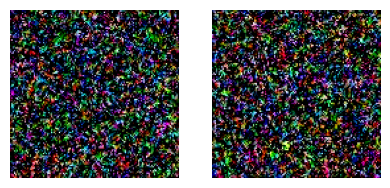

In [16]:
cfg = {
    'model_path': '/home/siddharth/siddharth/ADRL/Assignment_3/models/q1/try2/epoch_990/model.pth',
    'num_imgs': 2,
    'in_channels': 3,
    'img_size': 128,
    'num_timesteps': 50,
    'device' : 'cuda',
    'classifier_model': '/home/siddharth/siddharth/ADRL/Assignment_3/models/q5/classifier_max_val_acc.pth',
    'req_class': torch.tensor([0, 1]),
}
out = generate_class(cfg)
visualize_ddpm_generated_images(out, n_cols=4, figsize=(10, 10))

### 8. NOISE-CONDITIONAL SCORE NETWORK (Q.6)

#### Architecture

A Noise Conditional Score Network (NCSN) was implemented and trained to estimate noise scores across varying noise levels using a U-Net-based architecture. Noise levels were defined through a geometric progression of 
σ
σ values, which were sampled randomly for each batch during training. The training leveraged the Vincent score as the true score for optimization, with Mean Squared Error (MSE) loss used to minimize the difference between predicted and true scores.

In [5]:
class reverse_diff(nn.Module):
    def __init__(self, cfg):
        super(reverse_diff, self).__init__()

        num_time_steps = cfg["num_timesteps"]
        beta_start = cfg["beta_start"]
        beta_end = cfg["beta_end"]

        self.betas = torch.linspace(beta_start, beta_end, num_time_steps)    
        self.alphas = 1 - self.betas
        self.alphas_cumprod = torch.cumprod(self.alphas, dim=0)

    def sample_q(self, xt, noise, t):
        x0 = xt - (torch.sqrt(1 - self.alphas_cumprod.to(xt.device)[t]) * noise)
        x0 = x0 / torch.sqrt(self.alphas_cumprod.to(xt.device)[t])

        mean = (xt - ((1 - self.alphas.to(xt.device)[t]) * noise) / (torch.sqrt(1 - self.alphas_cumprod.to(xt.device)[t])))
        mean = mean / (torch.sqrt(self.alphas.to(xt.device)[t]))

        if t == 0:
            return mean, x0
        else:
            variance = (1 - self.alphas_cumprod.to(xt.device)[t - 1]) / (1 - self.alphas_cumprod.to(xt.device)[t])  
            variance = variance * self.betas.to(xt.device)[t]
            sigma = variance ** 0.5
            z = torch.randn(xt.shape).to(xt.device) 

            return mean + sigma * z, x0


def get_time_embedding(time_steps: torch.Tensor, t_emb_dim: int) -> torch.Tensor:
    assert t_emb_dim % 2 == 0, "Time embedding dimension must be divisible by 2."
    factor = 2 * torch.arange(0, t_emb_dim // 2, dtype=torch.float32, device=time_steps.device) / t_emb_dim
    factor = 10000 ** factor
    t_emb = time_steps[:, None] / factor  
    t_emb = torch.cat([torch.sin(t_emb), torch.cos(t_emb)], dim=1)
    return t_emb


class NormActivation(nn.Module):
    def __init__(self, in_channels: int, out_channels: int, num_groups: int = 8, kernel_size: int = 3, norm: bool = True, act: bool = True):
        super(NormActivation, self).__init__()
        self.g_norm = nn.GroupNorm(num_groups, in_channels) if norm else nn.Identity()
        self.act = nn.SiLU() if act else nn.Identity()
        self.conv = nn.Conv2d(in_channels, out_channels, kernel_size, padding=(kernel_size - 1) // 2)

    def forward(self, x):
        return self.conv(self.act(self.g_norm(x)))


class SelfAttentionBlock(nn.Module):
    def __init__(self, channels, num_heads=1):
        super(SelfAttentionBlock, self).__init__()
        self.num_heads = num_heads
        self.norm = nn.GroupNorm(8, channels)
        self.qkv = nn.Conv2d(channels, channels * 3, kernel_size=1)
        self.proj_out = nn.Conv2d(channels, channels, kernel_size=1)

    def forward(self, x):
        batch, channels, height, width = x.shape
        h = self.norm(x)
        qkv = self.qkv(h)
        q, k, v = torch.chunk(qkv, 3, dim=1)
        q = q.reshape(batch, self.num_heads, channels // self.num_heads, height * width)
        k = k.reshape(batch, self.num_heads, channels // self.num_heads, height * width)
        v = v.reshape(batch, self.num_heads, channels // self.num_heads, height * width)
        scale = (channels // self.num_heads) ** -0.5
        weights = torch.softmax(torch.einsum("bhcd,bhkd->bhck", q * scale, k), dim=-1)
        attn_out = torch.einsum("bhck,bhkd->bhcd", weights, v).reshape(batch, channels, height, width)
        return x + self.proj_out(attn_out)


class DownConv(nn.Module):
    def __init__(self, in_channels, out_channels, cfg,t_emb_dim=128, num_layers=2, down_sample=True):
        super(DownConv, self).__init__()
        self.num_layers = num_layers
        self.add_attn = cfg["add_attn_down"]
        self.conv1 = nn.ModuleList([NormActivation(in_channels if i == 0 else out_channels, out_channels) for i in range(num_layers)])
        self.conv2 = nn.ModuleList([NormActivation(out_channels, out_channels) for _ in range(num_layers)])
        self.te_block = nn.ModuleList([TimeEmbedding(out_channels, t_emb_dim) for _ in range(num_layers)])
        self.down_block = Downsample(out_channels, out_channels) if down_sample else nn.Identity()
        self.res_block = nn.ModuleList([nn.Conv2d(in_channels if i == 0 else out_channels, out_channels, kernel_size=1) for i in range(num_layers)])

        self.attn_block = SelfAttentionBlock(out_channels) if self.add_attn else nn.Identity()

    def forward(self, x, t_emb):
        out = x
        for i in range(self.num_layers):
            resnet_input = out
            out = self.conv1[i](out)
            out = out + self.te_block[i](t_emb)[:, :, None, None]
            out = self.conv2[i](out)
            out = out + self.res_block[i](resnet_input)
            out = self.attn_block(out)
            
        out = self.down_block(out)
        return out

class MidConv(nn.Module):
    def __init__(self, in_channels, out_channels, cfg,t_emb_dim=128, num_layers=2):
        super(MidConv, self).__init__()
        self.num_layers = num_layers
        self.add_attn = cfg["add_attn_mid"]
        self.conv1 = nn.ModuleList([NormActivation(in_channels if i == 0 else out_channels, out_channels) for i in range(num_layers+1)])
        self.conv2 = nn.ModuleList([NormActivation(out_channels, out_channels) for _ in range(num_layers+1)])
        self.te_block = nn.ModuleList([TimeEmbedding(out_channels, t_emb_dim) for _ in range(num_layers+1)])
        self.res_block = nn.ModuleList([nn.Conv2d(in_channels if i == 0 else out_channels, out_channels, kernel_size=1) for i in range(num_layers+1)])
        self.attn_block = SelfAttentionBlock(out_channels) if self.add_attn else nn.Identity()

    def forward(self, x, t_emb):
        out = x
        for i in range(self.num_layers):
            resnet_input = out
            out = self.conv1[i](out)
            out = out + self.te_block[i](t_emb)[:, :, None, None]
            out = self.conv2[i](out)
            out = out + self.res_block[i](resnet_input)
            out = self.attn_block(out)
        return out


class UpConv(nn.Module):
    def __init__(self, in_channels, out_channels, cfg, t_emb_dim=128, num_layers=2, up_sample=True):
        super(UpConv, self).__init__()
        self.num_layers = num_layers
        self.add_attn = cfg["add_attn_up"]
        self.conv1 = nn.ModuleList([NormActivation(in_channels if i == 0 else out_channels, out_channels) for i in range(num_layers)])
        self.conv2 = nn.ModuleList([NormActivation(out_channels, out_channels) for _ in range(num_layers)])
        self.te_block = nn.ModuleList([TimeEmbedding(out_channels, t_emb_dim) for _ in range(num_layers)])
        self.up_block = Upsample(in_channels, in_channels // 2) if up_sample else nn.Identity()
        self.res_block = nn.ModuleList([nn.Conv2d(in_channels if i == 0 else out_channels, out_channels, kernel_size=1) for i in range(num_layers)])
        self.attn_block = SelfAttentionBlock(out_channels) if self.add_attn else nn.Identity()
        
    def forward(self, x, down_out, t_emb):
        x = self.up_block(x)
        x = torch.cat([x, down_out], dim=1)
        out = x
        for i in range(self.num_layers):
            resnet_input = out
            out = self.conv1[i](out)
            out = out + self.te_block[i](t_emb)[:, :, None, None]
            out = self.conv2[i](out)
            out = out + self.res_block[i](resnet_input)
            out = self.attn_block(out)
        return out


class TimeEmbedding(nn.Module):
    def __init__(self, out_channels, t_emb_dim):
        super(TimeEmbedding, self).__init__()
        self.time_emb = nn.Sequential(
            nn.Linear(t_emb_dim, out_channels),
            nn.SiLU(),
            nn.Linear(out_channels, out_channels)
        )

    def forward(self, t_emb):
        return self.time_emb(t_emb)

class Upsample(nn.Module):
    def __init__(self, in_channels, out_channels):
        super(Upsample, self).__init__()
        self.up_conv = nn.ConvTranspose2d(in_channels, out_channels, kernel_size=2, stride=2)

    def forward(self, x):
        return self.up_conv(x)


class Downsample(nn.Module):
    def __init__(self, in_channels, out_channels):
        super(Downsample, self).__init__()
        self.down_conv = nn.Conv2d(in_channels, out_channels, kernel_size=2, stride=2)

    def forward(self, x):
        return self.down_conv(x)


class Unet_nc(nn.Module):
    def __init__(self,cfg):
        super(Unet_nc, self).__init__()
        
        self.im_channels = cfg["im_channels"]
        self.down_ch = cfg["down_ch"]
        self.mid_ch = cfg["mid_ch"]
        self.up_ch = cfg["up_ch"]
        self.down_sample = cfg["down_sample"]
        self.t_emb_dim = cfg["t_emb_dim"]
        self.num_downc_layers = cfg["num_downc_layers"]
        self.num_midc_layers = cfg["num_midc_layers"]
        self.num_upc_layers = cfg["num_upc_layers"]
        
        self.up_sample = list(reversed(self.down_sample)) # [False, True, True]
        
        # Initial Convolution
        self.cv1 = nn.Conv2d(self.im_channels, self.down_ch[0], kernel_size=3, padding=1)
        
        # Initial Time Embedding Projection
        self.t_proj = nn.Sequential(
            nn.Linear(self.t_emb_dim, self.t_emb_dim), 
            nn.SiLU(), 
            nn.Linear(self.t_emb_dim, self.t_emb_dim)
        )
        
        # DownC Blocks
        self.downs = nn.ModuleList([
            DownConv(
                self.down_ch[i], 
                self.down_ch[i+1], 
                cfg,
                self.t_emb_dim, 
                self.num_downc_layers, 
                self.down_sample[i]
            ) for i in range(len(self.down_ch) - 1)
        ])
        
        # MidC Block
        self.mids = nn.ModuleList([
            MidConv(
                self.mid_ch[i], 
                self.mid_ch[i+1], 
                cfg,
                self.t_emb_dim, 
                self.num_midc_layers
            ) for i in range(len(self.mid_ch) - 1)
        ])
        add_attn = cfg["add_attn_up"]
        # UpC Block
        self.ups = nn.ModuleList([
            UpConv(
                self.up_ch[i], 
                self.up_ch[i+1], 
                cfg,
                self.t_emb_dim, 
                self.num_upc_layers, 
                self.up_sample[i]
            ) for i in range(len(self.up_ch) - 1)
        ])
        
        # Final Convolution
        self.cv2 = nn.Sequential(
            nn.GroupNorm(8, self.up_ch[-1]), 
            nn.Conv2d(self.up_ch[-1], self.im_channels, kernel_size=3, padding=1)
        )
        
    def forward(self, x, sigma):
        
        out = self.cv1(x)
        t = sigma
        # Time Projection
        t_emb = get_time_embedding(t, self.t_emb_dim)
        #print(f'Shape of t_emb is : {t_emb.shape}')
        t_emb = self.t_proj(t_emb)
        
        # DownC outputs
        down_outs = []
        
        for down in self.downs:
            down_outs.append(out)
            out = down(out, t_emb)
        
        # MidC outputs
        for mid in self.mids:
            out = mid(out, t_emb)
        
        # UpC Blocks
        for up in self.ups:
            down_out = down_outs.pop()
            out = up(out, down_out, t_emb)
            
        # Final Conv
        out = self.cv2(out)
        #print(f'Shape of out is : {out.shape} and shape of sigma is : {sigma.shape}')
        out = out / sigma.view(-1, 1, 1, 1)
        return out

In [6]:
class ForwardDiffNoiseConditional(nn.Module):
    def __init__(self, cfg):
        super(ForwardDiffNoiseConditional, self).__init__()

        # Extract parameters from config
        num_time_steps = cfg["num_timesteps"]
        sigma_start = cfg["sigma_start"]
        common_ratio = cfg["common_ratio"]

        # Allocate sigmas in a geometric progression (GP)
        # Sigmas from sigma_start to sigma_num_time_steps
        self.sigmas = sigma_start * common_ratio ** torch.arange(num_time_steps, dtype=torch.float32)
    

    def sample_random_sigma_batch(self, batch_size):
        """
        Sample a batch of random sigma values with size equal to batch_size.

        Parameters:
        - batch_size: The number of sigmas to sample, typically equal to the size of the input batch.

        Returns:
        - A tensor of randomly sampled sigma values of shape (batch_size,)
        """
        random_indices = torch.randint(0, len(self.sigmas), (batch_size,))  # Generate random indices
        sigma_batch = self.sigmas[random_indices]  # Get sigma values at the random indices
        return sigma_batch

    def forward(self, x, sigma_t, noise):
        """
        Forward pass for applying noise corresponding to time step t.
        
        Parameters:
        - x: Input image
        - t: Time step (index for sigma)
        
        Returns:
        - Noisy image according to the corresponding sigma value.
        """
        # sigma_t = self.sigmas[t].view(-1, 1, 1, 1)  # Reshape for broadcasting over image dimensions
        noisy_x = x + noise * sigma_t.view(-1, 1, 1, 1)  # Add Gaussian noise
        return noisy_x

#### Train Loop

In [ ]:
def train_NCSN(cfg):
    UNet_model = cfg['model']
    train_data = cfg['train_data']  
    num_epochs = cfg['num_epochs']
    save_after = cfg['save_after']
    lr = cfg['lr']
    model_save_path = cfg['model_save_path']
    loss_file_path = cfg['loss_file_path']
    device = cfg['device']
    batch_size = cfg['batch_size']
    
    train_loader = DataLoader(train_data, batch_size=batch_size, shuffle=True)
    optimizer = torch.optim.Adam(UNet_model.parameters(), lr=lr)
    criterion = nn.MSELoss()
    
    # Move model to device (GPU or CPU)
    UNet_model = UNet_model.to(device)
    
    # Initialize noise sampler once, outside the loop
    noiser = ForwardDiffNoiseConditional(cfg)
    
    for epoch in range(num_epochs):
        total_loss = 0
        num_batches = 0
        
        # Training loop with progress bar
        tqdm_train = tqdm(train_loader, desc=f"Epoch {epoch+1}/{num_epochs}")
        
        for images, _ in tqdm_train:
            images = images.to(device)
            
            # Sample random sigmas for the batch
            sigma = noiser.sample_random_sigma_batch(images.shape[0]).to(device)
            
            # Sample Gaussian noise
            epsilon = torch.randn_like(images).to(device)
            
            # Add noise to the images to generate noisy images
            noisy_images = images + sigma.view(-1, 1, 1, 1) * epsilon
            
            # Forward pass through the score model (UNet)
            optimizer.zero_grad()
            outputs = UNet_model(noisy_images, sigma)
            
            # Compute true score (Vincent score)
            Vincent_score = -(epsilon / sigma.view(-1, 1, 1, 1))
            
            # Compute loss (MSE between predicted and true score)
            loss = criterion(outputs, Vincent_score)
            loss.backward()
            optimizer.step()
            
            # Accumulate the total loss for logging
            total_loss += loss.item()
            num_batches += 1
            
            # Update progress bar with current and average loss
            avg_loss = total_loss / num_batches
            tqdm_train.set_postfix(loss=loss.item(), avg_loss=avg_loss)
        
        # Save model checkpoint after every few epochs
        if (epoch+1) % save_after == 0:
            torch.save(UNet_model.state_dict(), f'{model_save_path}/model_epoch_{epoch+1}.pth')
            print(f"Model saved at epoch {epoch+1} with loss {avg_loss:.4f}")
        
        # Log the loss to the file after each epoch
        with open(loss_file_path, 'a') as f:
            f.write(f"Epoch {epoch+1} \t loss: {avg_loss:.4f}\n")
        



In [ ]:
NCSN_cfg = {
    'model' : model,
    "model_save_path": '/home/siddharth/siddharth/ADRL/Assignment_3/models/q6',
    # "train_data": train_dataset,
    "num_epochs": 1000,
    "lr": 1e-4,
    "num_timesteps": 1000,
    "save_after" : 20,
    "batch_size": 64,
    "img_size": 128,
    "in_channels": 3,
    "device":"cuda", # List of values for the number of images to generate
    "loss_file_path": '/home/siddharth/siddharth/ADRL/Assignment_3/loss/q6/loss1.txt',


    # Noise parameters
    "sigma_start": 0.01,
    "common_ratio": 1.1,

    # Attention parameters
    "add_attn_down": True,
    "add_attn_mid": True,
    "add_attn_up": True,

}

In [ ]:
train_NCSN(NCSN_cfg)

#### Langevin Sampling

To perform image generation using a Noise Conditional Score Network (NCSN), Langevin Dynamics sampling was implemented. This method iteratively refines random noise into realistic images by leveraging the NCSN model's score predictions for noise levels.

Key aspects include:

**Initialization**: The process starts with random noise of the same shape as the target images.

**Annealing Across Noise Levels**: Noise levels (
σ
σ) are used in descending order to progressively refine the images. At each noise level, multiple Langevin steps are applied.

**Langevin Dynamics Updates**: For each step, the score (predicted noise gradient) is computed using the NCSN model. The update combines the score and Gaussian noise, scaled by a factor proportional to the current noise level.

**Normalization**: The generated images are normalized for visualization after each noise level.
The sampling process was applied to a U-Net architecture configured with attention mechanisms and hierarchical layers. 

In [ ]:
def langevin_dynamics_sampling(model, sigmas, num_steps, image_shape, device):
    
    # Initialize with random noise
    x = torch.randn(image_shape).to(device)
    model = model.to(device)
    # Iterate through noise levels (annealing)
    for i in range(len(sigmas)):
        epsilon = 0.05
        alpha_i = epsilon * (sigmas[i]**2/sigmas[len(sigmas)-1]**2)
        sigma_tensor = torch.full((image_shape[0],), alpha_i).to(device)
        #print(sigma_tensor.shape)
        for _ in tqdm(range(num_steps), desc=f"Sigma: {i}"):
            x.requires_grad_(True)
            
            # Compute the score (output of the model)
            score = model(x, sigma_tensor)
            
            # Langevin dynamics update
            noise = torch.randn_like(x)
            x = x + (alpha_i/2) * score + torch.sqrt(alpha_i) * noise
            
            # Clamp or normalize the pixel values if needed
            #x = torch.clamp(x, -1.0, 1.0)
            x = x.detach()
            
        normalized_x = (x - torch.min(x)) / (torch.max(x) - torch.min(x))
        visualize_ddpm_generated_images(normalized_x, n_cols=2, figsize=(10, 10))     
    return x

In [8]:
Unet_cfg = {
    
    # Unet parameters   
    "im_channels": 3,
    "down_ch": [32, 64, 128, 256],
    "mid_ch": [256, 256, 128],
    "up_ch": [256, 128, 64, 16],
    "down_sample": [True, True, False],
    "t_emb_dim": 128,
    "num_downc_layers": 3,
    "num_midc_layers": 3,
    "num_upc_layers": 3,
    
    # Attention parameters
    "add_attn_down": True,
    "add_attn_mid": True,
    "add_attn_up": True,
}

In [9]:
torch.cuda.empty_cache()

/tmp/ipykernel_24644/1978745515.py:2: FutureWarning: You are using `torch.load` with `weights_only=False` (the current default value), which uses the default pickle module implicitly. It is possible to construct malicious pickle data which will execute arbitrary code during unpickling (See https://github.com/pytorch/pytorch/blob/main/SECURITY.md#untrusted-models for more details). In a future release, the default value for `weights_only` will be flipped to `True`. This limits the functions that could be executed during unpickling. Arbitrary objects will no longer be allowed to be loaded via this mode unless they are explicitly allowlisted by the user via `torch.serialization.add_safe_globals`. We recommend you start setting `weights_only=True` for any use case where you don't have full control of the loaded file. Please open an issue on GitHub for any issues related to this experimental feature.
  UNet_model.load_state_dict(torch.load('/home/siddharth/siddharth/ADRL/Assignment_3/models

10


Sigma: 1: 100%|██████████| 150/150 [00:07<00:00, 21.17it/s]


10


Sigma: 2: 100%|██████████| 150/150 [00:07<00:00, 21.11it/s]


10


Sigma: 3: 100%|██████████| 150/150 [00:07<00:00, 21.06it/s]


10


Sigma: 4: 100%|██████████| 150/150 [00:07<00:00, 20.99it/s]


10


Sigma: 5: 100%|██████████| 150/150 [00:07<00:00, 20.95it/s]


10


Sigma: 6: 100%|██████████| 150/150 [00:07<00:00, 20.90it/s]


10


Sigma: 7: 100%|██████████| 150/150 [00:07<00:00, 20.86it/s]


10


Sigma: 8: 100%|██████████| 150/150 [00:07<00:00, 20.81it/s]


10


Sigma: 9: 100%|██████████| 150/150 [00:07<00:00, 20.80it/s]


10


Sigma: 10: 100%|██████████| 150/150 [00:07<00:00, 20.79it/s]


10


Sigma: 11: 100%|██████████| 150/150 [00:07<00:00, 20.73it/s]


10


Sigma: 12: 100%|██████████| 150/150 [00:07<00:00, 20.73it/s]


10


Sigma: 13: 100%|██████████| 150/150 [00:07<00:00, 20.75it/s]


10


Sigma: 14: 100%|██████████| 150/150 [00:07<00:00, 20.75it/s]


10


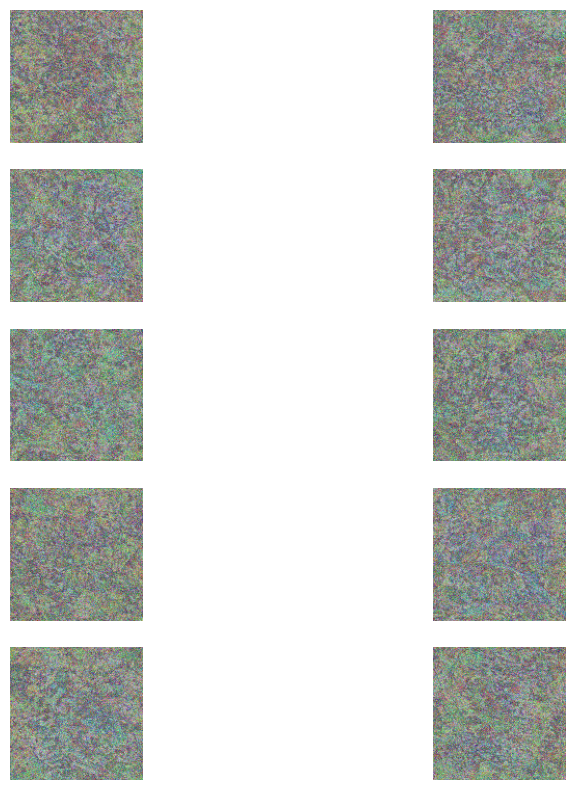

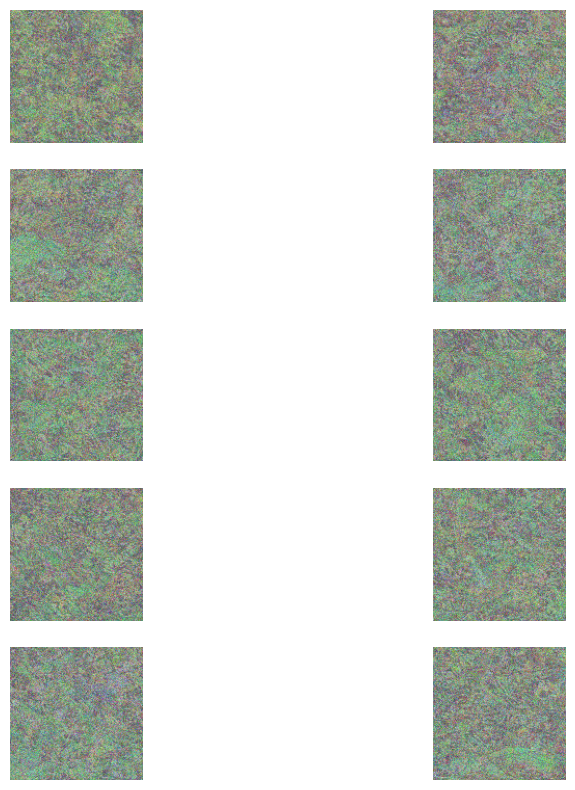

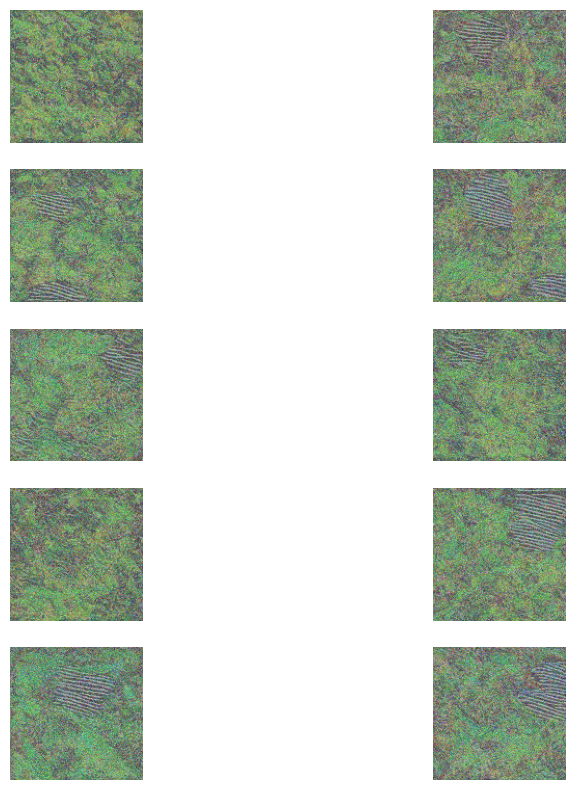

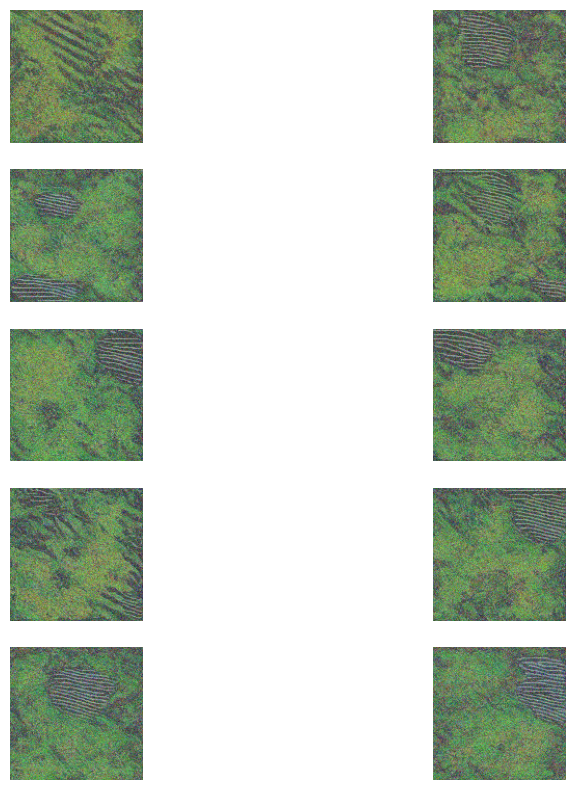

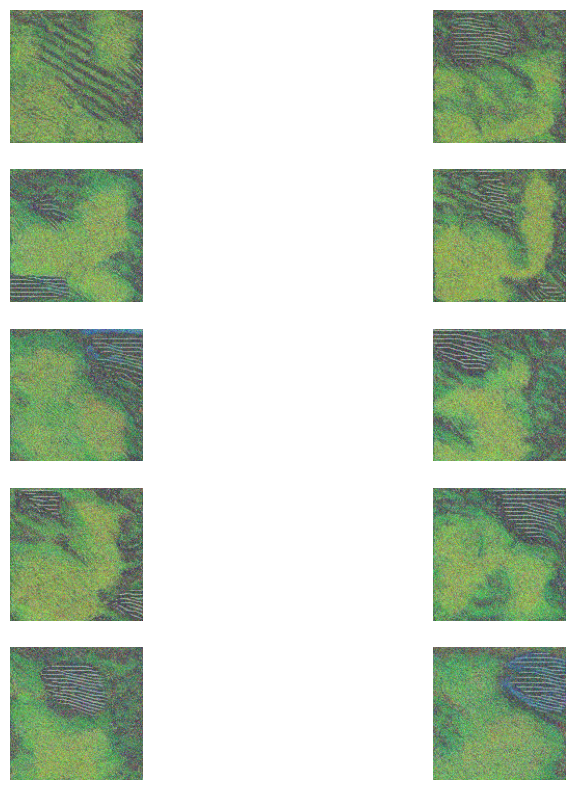

...

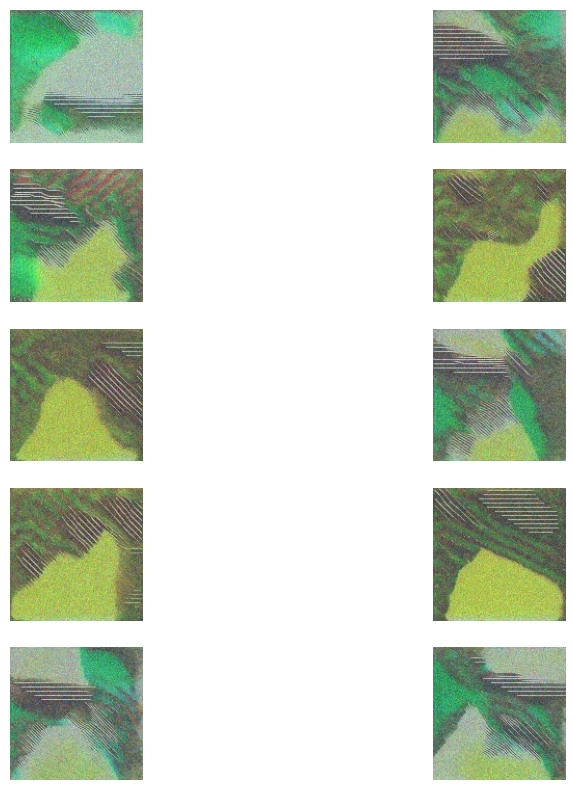

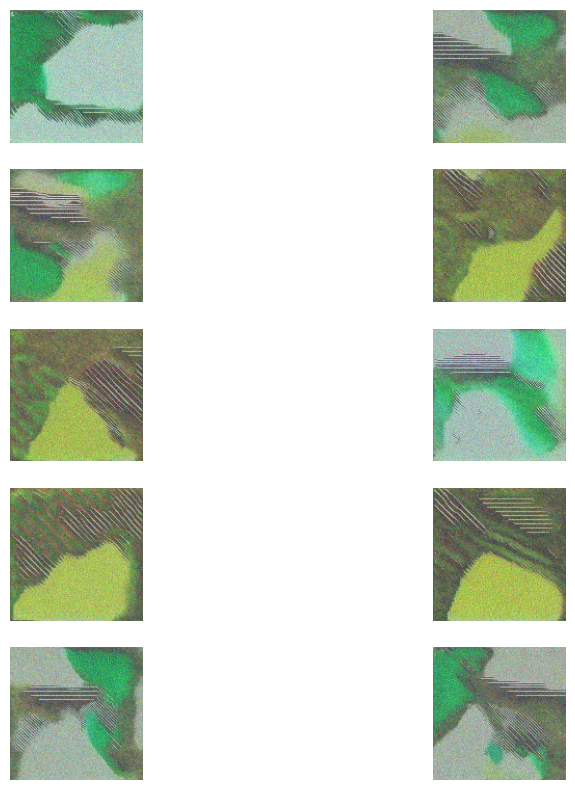

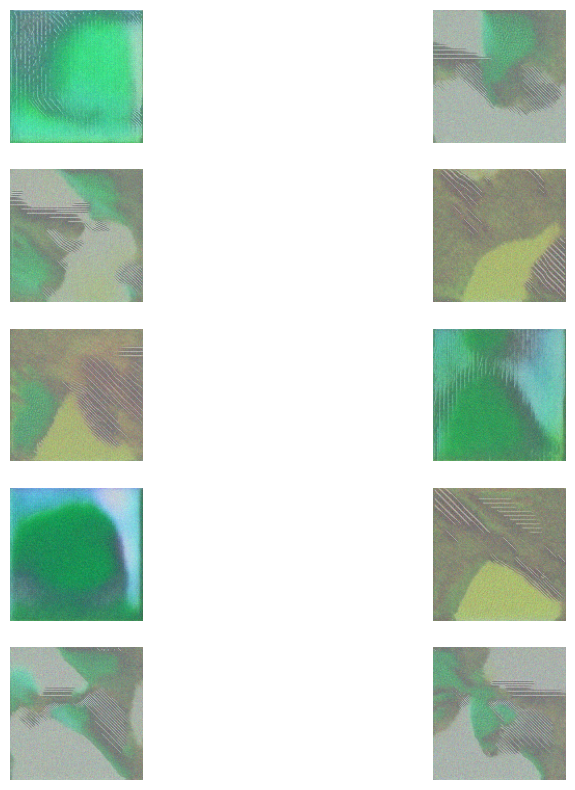

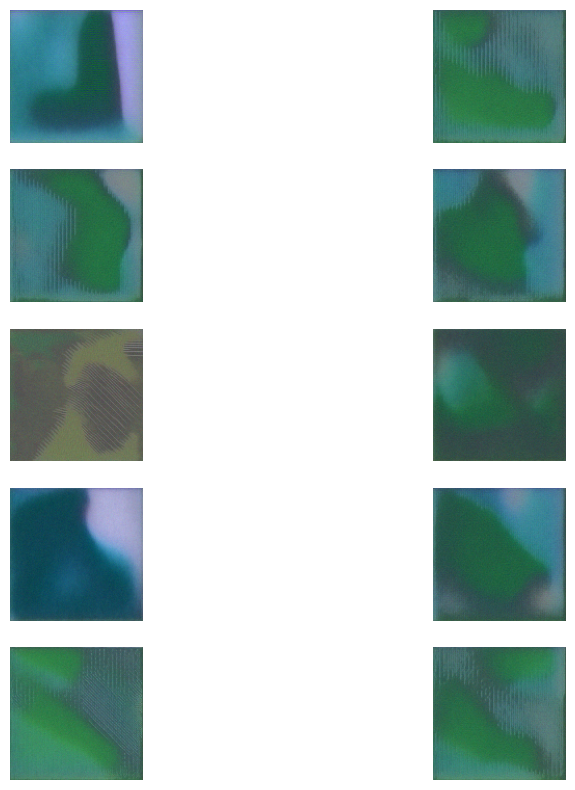

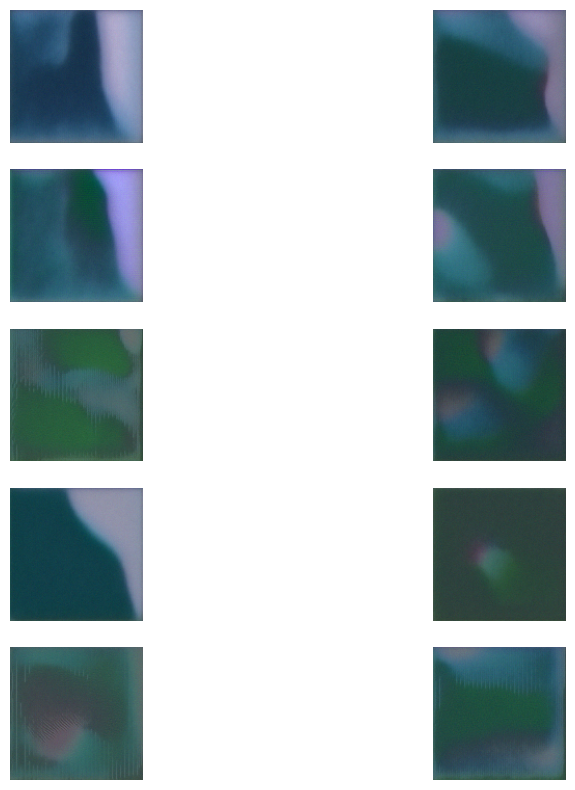

In [14]:
UNet_model = Unet_nc(Unet_cfg)
UNet_model.load_state_dict(torch.load('/home/siddharth/siddharth/ADRL/Assignment_3/models/q6/model_epoch_600.pth'))
UNet_model.eval()
noiser = ForwardDiffNoiseConditional({'num_timesteps': 15, 'sigma_start': 1.5, 'common_ratio': 0.91})
sigmas = noiser.sigmas
num_steps = 150
image_shape = (10, 3, 128, 128)
device = 'cuda'
xt = langevin_dynamics_sampling(UNet_model, sigmas, num_steps, image_shape, device)
# Optionally save or visualize generated images


Total denoising time : 1m 50s

In [23]:
data = ButterflyDataset(data_folder_aug_butterfly)

In [25]:
dataloader = DataLoader(data, batch_size=10, shuffle=True)
for batch in dataloader:
    images, labels = batch
    break
images.shape

torch.Size([10, 3, 128, 128])

In [27]:
calculate_fid(images, xt, 8)

/home/siddharth/anaconda3/envs/adrl/lib/python3.9/site-packages/torchvision/models/_utils.py:208: UserWarning: The parameter 'pretrained' is deprecated since 0.13 and may be removed in the future, please use 'weights' instead.
  warnings.warn(
/home/siddharth/anaconda3/envs/adrl/lib/python3.9/site-packages/torchvision/models/_utils.py:223: UserWarning: Arguments other than a weight enum or `None` for 'weights' are deprecated since 0.13 and may be removed in the future. The current behavior is equivalent to passing `weights=Inception_V3_Weights.IMAGENET1K_V1`. You can also use `weights=Inception_V3_Weights.DEFAULT` to get the most up-to-date weights.
  warnings.warn(msg)


5215.4321049963855

### 9. DDIM SAMPLER (Q.7)

The DDIM (Denoising Diffusion Implicit Models) sampling technique was utilized for efficient image generation, offering a deterministic approach while preserving high-quality results. This method reduces the number of sampling steps leading to a significant improvement in generation speed.

Key details include:

**Improved Sampling Speed**: By utilizing fewer diffusion steps, DDIM achieves faster image generation while maintaining output fidelity.

**Generated Image Visualization**: The generated images were visualized to validate the model's ability to produce realistic and high-quality outputs efficiently.

In [ ]:
class reverse_diff_ddim(nn.Module):
    def __init__(self, cfg):
        super(reverse_diff_ddim, self).__init__()

        num_time_steps = cfg["num_timesteps"]
        beta_start = cfg["beta_start"]
        beta_end = cfg["beta_end"]

        self.betas = torch.linspace(beta_start, beta_end, num_time_steps).to("cuda")
        self.alphas = 1 - self.betas
        self.alphas_cumprod = torch.cumprod(self.alphas, dim=0).to("cuda")

    def sample_q(self, xt, noise_pred, t, eta=0.0):
        
        alpha_t = self.alphas_cumprod[t]
        alpha_t_1 = self.alphas_cumprod[t - 1] if t > 0 else torch.tensor(1.0, device=xt.device)
        x0 = (xt - torch.sqrt(1 - alpha_t) * noise_pred) / torch.sqrt(alpha_t)
        mean = torch.sqrt(alpha_t_1) * x0 + torch.sqrt(1 - alpha_t_1) * noise_pred

        if eta > 0.0 and t > 0:
            z = torch.randn_like(xt)
            return mean 
        else:
            return mean
        
def ddim_generate(cfg, eta=0.0):
    device = cfg["device"]
    drp = reverse_diff_ddim(cfg)

    model = torch.load(cfg["model_path"]).to(device)
    model.eval()

    xt = torch.randn(cfg["num_images"], cfg["in_channels"], cfg["img_size"], cfg["img_size"]).to(device)
    t_steps = torch.linspace(0, cfg["num_timesteps"] - 1, cfg["steps"]).long()
    
    with torch.no_grad():
        for t in tqdm(reversed(t_steps), desc="Generating Images", unit="timestep", total=len(t_steps)):
            noise_pred = model(xt, torch.as_tensor(t).unsqueeze(0).to(device))
            xt= drp.sample_q(xt, noise_pred, torch.as_tensor(t).to(device))

    return xt


def visualize_generated_images(images, n_cols=5, figsize=(10, 10)):
    images = images.cpu().detach().numpy()
    batch_size = images.shape[0]
    n_rows = int(np.ceil(batch_size / n_cols))
    plt.figure(figsize=figsize)

    for i in range(batch_size):
        plt.subplot(n_rows, n_cols, i + 1)
        img = images[i].transpose(1, 2, 0)  
        # print(img.shape)
        img = np.clip(img, 0, 1)
        plt.imshow(img)
        plt.axis('off')  

/tmp/ipykernel_34565/3025941118.py:5: FutureWarning: You are using `torch.load` with `weights_only=False` (the current default value), which uses the default pickle module implicitly. It is possible to construct malicious pickle data which will execute arbitrary code during unpickling (See https://github.com/pytorch/pytorch/blob/main/SECURITY.md#untrusted-models for more details). In a future release, the default value for `weights_only` will be flipped to `True`. This limits the functions that could be executed during unpickling. Arbitrary objects will no longer be allowed to be loaded via this mode unless they are explicitly allowlisted by the user via `torch.serialization.add_safe_globals`. We recommend you start setting `weights_only=True` for any use case where you don't have full control of the loaded file. Please open an issue on GitHub for any issues related to this experimental feature.
  model = torch.load(cfg["model_path"]).to(device)
Generating Images: 100%|██████████| 900/

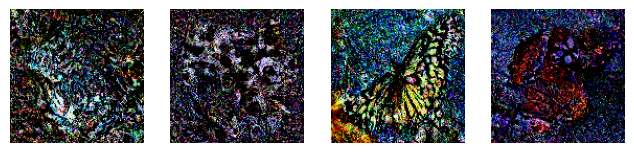

In [17]:
ddim_cfg = {
    "num_timesteps": 1000,
    "img_size": 128,
    "in_channels": 3,
    "num_images": 4, 
    "device":"cuda",  
    
    # Diffusion parameters
    "beta_start": 1e-4,
    "beta_end": 0.01,
    "model_path" : '/home/siddharth/siddharth/ADRL/Assignment_3/models/q1/try2/epoch_990/model.pth',
    "steps" : 900, 
}
eta = 0.0

generated_imgs = ddim_generate(ddim_cfg)
visualize_generated_images(generated_imgs, n_cols=5, figsize=(10, 10))

### 10. DDIM INVERSION METHOD (Q.8)

DDIM inversion method was implemented to generate interpolated images between two real images in the latent space. The process involves the following steps:

**Forward Diffusion (Inversion)**: Real images are perturbed to their latent representations by adding noise according to a predefined noise schedule. This step inverts the images into their corresponding latents.

**Latent Space Interpolation**: Linear interpolation is performed between the latent representations of the two images, generating a series of intermediate latents that transition smoothly from one image to the other.

**Reverse Diffusion (Generation)**: The DDIM reverse diffusion process is applied to the interpolated latents, progressively denoising them to generate the corresponding images in the data space.



In [ ]:
class forward_diff(nn.Module):
    def __init__(self, cfg):
        super(forward_diff, self).__init__()
        
        num_time_steps = cfg["num_timesteps"]
        beta_start = cfg["beta_start"]
        beta_end = cfg["beta_end"]
        
        self.betas = torch.linspace(beta_start, beta_end, num_time_steps)    
        self.alphas = 1 - self.betas
        self.alphas_cumprod = torch.cumprod(self.alphas, dim=0)
        self.sqrt_alphas_cumprod = torch.sqrt(self.alphas_cumprod)
        self.sqrt_one_minus_alphas_cumprod = torch.sqrt(1 - self.alphas_cumprod)

    def add_noise(self, orig_img, noise, t):
        sqrt_alpha_bar_t = self.sqrt_alphas_cumprod[t].to(orig_img.device)
        sqrt_one_minus_alpha_bar_t = self.sqrt_one_minus_alphas_cumprod[t]

        # sqrt_alpha_bar_t = sqrt_alpha_bar_t[:, None, None, None]    
        # sqrt_one_minus_alpha_bar_t = sqrt_one_minus_alpha_bar_t[:, None, None, None]

        return sqrt_alpha_bar_t * orig_img + sqrt_one_minus_alpha_bar_t * noise
    
def linear_interpolate(latent1, latent2, num_steps=10):
    # Initialize the list of latents, with latent1 and latent2 at the start and end
    interpolated_latents = [latent1]
    
    # Add interpolated latents between latent1 and latent2
    for step in range(1, num_steps+1):
        interpolated_latents.append(latent1 * (1 - step / num_steps) + latent2 * (step / num_steps))
    
    return torch.stack(interpolated_latents, dim=0)

def ddim_generate(cfg, xt,eta=0.0):  
    device = cfg["device"]
    drp = reverse_diff_ddim(cfg)

    model = torch.load(cfg["model_path"]).to(device)
    model.eval()
    
    if xt is None:
        print("xt not sent")
    
    with torch.no_grad():
        for t in tqdm(reversed(range(cfg["num_timesteps"])), desc="Generating Images", unit="timestep", total=cfg["num_timesteps"]):
            noise_pred = model(xt, torch.as_tensor(t).unsqueeze(0).to(device))   
            xt = drp.sample_q(xt, noise_pred, torch.as_tensor(t).to(device), eta=eta)
    
    xt = torch.clamp(xt, -1., 1.).detach().cpu()
    return xt


def visualize_generated_images(images, img1, img2, n_cols=14, figsize=(20, 5)):
    images = images.cpu().detach().numpy()  # Convert batch to numpy

    img1 = img1.unsqueeze(0).cpu().detach().numpy()  
    img2 = img2.unsqueeze(0).cpu().detach().numpy()  

    # Add img1 and img2 to the generated images
    all_images = np.concatenate([img1, images, img2], axis=0)  # Concatenate along the batch dimension

    n_images = all_images.shape[0]  # Number of images (img1, generated images, img2)
    n_rows = 1  # Since we want all images in one row


    titles = ['Img 1', 'Noise 1'] + [f'Latent {i+1}' for i in range(n_cols - 4)] + ['Noise 2', 'Img 2']


    plt.figure(figsize=figsize)

    for i in range(n_images):
        plt.subplot(n_rows, n_cols, i + 1)
        img = all_images[i]

        # If the image is in CxHxW format, transpose it to HxWxC
        if img.ndim == 3 and img.shape[0] == 3:
            img = img.transpose(1, 2, 0)  # Convert from CxHxW to HxWxC

        img = np.clip(img, 0, 1)  # Clip to valid image range [0, 1]
        plt.imshow(img)
        plt.axis('off')  # Hide axes
        plt.title(titles[i])

    plt.tight_layout()
    plt.show()

def get_latents_and_plot_interpolations(cfg):  
    train_data = ButterflyDataset(data_folder_aug_butterfly)
    train_loader = DataLoader(train_data, batch_size=32, shuffle=True)
    img1, _ = next(iter(train_loader))
    img2, _ = next(iter(train_loader))
    img1, img2 = img1[0].to(ddim_cfg["device"]), img2[0].to(ddim_cfg["device"])

    dfg = forward_diff(ddim_cfg)

    noise1 = torch.randn_like(img1).to(ddim_cfg["device"])
    noise2 = torch.randn_like(img2).to(ddim_cfg["device"])

    latent1 = dfg.add_noise(img1, noise1, cfg["num_timesteps"]-1)   
    latent2 = dfg.add_noise(img2, noise2, cfg["num_timesteps"]-1)

    interpolated_latents = linear_interpolate(latent1, latent2, num_steps=cfg["num_steps"])
    len(interpolated_latents)

    generated_imgs = ddim_generate(cfg, interpolated_latents, eta=0.0)
    
    return generated_imgs, img1, img2, interpolated_latents


In [ ]:
ddim_cfg = {
    "num_timesteps": 1000,
    "img_size": 128,
    "in_channels": 3,
    "device":"cuda",

    # Number of interpolation steps
    "num_steps":15,
    
    # Number of ddim steps
    "steps" : 100, 

    "num_pairs": 4,  # Number of pairs of images to interpolate between
   
    # Diffusion parameters
    "beta_start": 1e-4,
    "beta_end": 0.01,
    "model_path" : '/home/siddharth/siddharth/ADRL/Assignment_3/models/q1/try2/epoch_950/model.pth'
}

In [ ]:
generated_imgs, img1, img2, latents = get_latents_and_plot_interpolations(ddim_cfg)

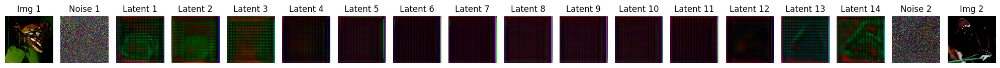

In [77]:
visualize_generated_images(generated_imgs, img1, img2, n_cols=len(latents) + 2, figsize=(20, 5))

### 11. RESNET-50 (Q.9)

In [9]:
dataset = AnimalsDataset(data_folder_aug_animals)
print(f'Number of classes in training data: {len(dataset.label_map)}')

Number of classes in training data: 90


In [10]:
model = models.resnet50(pretrained=True)
model.fc = nn.Linear(model.fc.in_features, 91)

/home/siddharth/anaconda3/envs/adrl/lib/python3.9/site-packages/torchvision/models/_utils.py:208: UserWarning: The parameter 'pretrained' is deprecated since 0.13 and may be removed in the future, please use 'weights' instead.
  warnings.warn(
/home/siddharth/anaconda3/envs/adrl/lib/python3.9/site-packages/torchvision/models/_utils.py:223: UserWarning: Arguments other than a weight enum or `None` for 'weights' are deprecated since 0.13 and may be removed in the future. The current behavior is equivalent to passing `weights=ResNet50_Weights.IMAGENET1K_V1`. You can also use `weights=ResNet50_Weights.DEFAULT` to get the most up-to-date weights.
  warnings.warn(msg)


In [11]:
# Train test val split of 80, 10, 10
train_size = int(0.8 * len(dataset))
val_size = int(0.1 * len(dataset))
test_size = len(dataset) - train_size - val_size
train_dataset, val_dataset, test_dataset = torch.utils.data.random_split(dataset, [train_size, val_size, test_size])
print(f"Train size: {len(train_dataset)}, Val size: {len(val_dataset)}, Test size: {len(test_dataset)}")

Train size: 8640, Val size: 1080, Test size: 1080


In [16]:
def train_resnet(model, train_dataset, val_dataset, num_epochs=50, batch_size=16, device='cuda', save_path = 'resnet50.pth'):
    model = model.to(device)
    criterion = nn.CrossEntropyLoss()
    optimizer = torch.optim.Adam(model.parameters(), lr=0.0001)
    train_loader = DataLoader(train_dataset, batch_size=batch_size, shuffle=True)
    val_loader = DataLoader(val_dataset, batch_size=batch_size, shuffle=False)

    for epoch in range(num_epochs):
        model.train()
        tqdm_train = tqdm(train_loader, desc=f"Epoch {epoch + 1}/{num_epochs} [Training]")
        total_loss = 0
        total_correct = 0
        num_data = 0

        for batch in tqdm_train:
            images, labels = batch[0].to(device), batch[1].to(device)
            optimizer.zero_grad()
            output = model(images)
            loss = criterion(output, labels)
            loss.backward()
            optimizer.step()
            total_loss += loss.item()
            total_correct += (output.argmax(1) == labels).sum().item()
            num_data += labels.size(0)
            accuracy = (total_correct / num_data) * 100
            tqdm_train.set_postfix(loss=total_loss / num_data, accuracy=accuracy)

        total_val_loss = 0
        total_correct_val = 0
        num_val_data = 0
        model.eval()

        with torch.no_grad():
            tqdm_val = tqdm(val_loader, desc=f"Epoch {epoch + 1}/{num_epochs} [Validation]")
            for batch in tqdm_val:
                images, labels = batch[0].to(device), batch[1].to(device)
                output = model(images)
                loss = criterion(output, labels)
                total_val_loss += loss.item()
                total_correct_val += (output.argmax(1) == labels).sum().item()
                num_val_data += labels.size(0)
                accuracy_val = (total_correct_val / num_val_data) * 100
                tqdm_val.set_postfix(val_loss=total_val_loss / num_val_data, val_accuracy=accuracy_val)
        
        avg_train_loss = total_loss / num_data
        avg_val_loss = total_val_loss / num_val_data
        train_accuracy = (total_correct / num_data) * 100
        val_accuracy = (total_correct_val / num_val_data) * 100
        
        print(f"Epoch {epoch + 1}/{num_epochs}:")
        print(f"    Train Loss: {avg_train_loss:.4f}, Train Accuracy: {train_accuracy:.2f}%")
        print(f"    Validation Loss: {avg_val_loss:.4f}, Validation Accuracy: {val_accuracy:.2f}%")
    
    
    # Save the model after training
    torch.save(model.state_dict(), save_path)
    print(f"Model saved to {save_path}")

In [17]:
path = "/home/siddharth/siddharth/ADRL/Assignment_3/models/q9/resnet50.pth"
model = train_resnet(model, train_dataset, val_dataset, num_epochs=20, batch_size=128, save_path = path)

Epoch 1/20 [Validation]: 100%|██████████| 9/9 [00:00<00:00, 17.92it/s, val_accuracy=80.6, val_loss=0.00996]


Epoch 1/20:
    Train Loss: 0.0205, Train Accuracy: 52.04%
    Validation Loss: 0.0100, Validation Accuracy: 80.65%


Epoch 2/20 [Validation]: 100%|██████████| 9/9 [00:00<00:00, 18.61it/s, val_accuracy=90.1, val_loss=0.00376]


Epoch 2/20:
    Train Loss: 0.0038, Train Accuracy: 92.88%
    Validation Loss: 0.0038, Validation Accuracy: 90.09%


Epoch 3/20 [Validation]: 100%|██████████| 9/9 [00:00<00:00, 18.63it/s, val_accuracy=94, val_loss=0.00231]  


Epoch 3/20:
    Train Loss: 0.0007, Train Accuracy: 99.38%
    Validation Loss: 0.0023, Validation Accuracy: 93.98%


Epoch 4/20 [Validation]: 100%|██████████| 9/9 [00:00<00:00, 18.68it/s, val_accuracy=94.7, val_loss=0.00196]


Epoch 4/20:
    Train Loss: 0.0002, Train Accuracy: 99.92%
    Validation Loss: 0.0020, Validation Accuracy: 94.72%


Epoch 5/20 [Validation]: 100%|██████████| 9/9 [00:00<00:00, 18.79it/s, val_accuracy=94.2, val_loss=0.00189]


Epoch 5/20:
    Train Loss: 0.0001, Train Accuracy: 99.97%
    Validation Loss: 0.0019, Validation Accuracy: 94.17%


Epoch 6/20 [Validation]: 100%|██████████| 9/9 [00:00<00:00, 18.83it/s, val_accuracy=94.2, val_loss=0.0019] 


Epoch 6/20:
    Train Loss: 0.0001, Train Accuracy: 99.99%
    Validation Loss: 0.0019, Validation Accuracy: 94.17%


Epoch 7/20 [Validation]: 100%|██████████| 9/9 [00:00<00:00, 18.11it/s, val_accuracy=94.4, val_loss=0.0018] 


Epoch 7/20:
    Train Loss: 0.0000, Train Accuracy: 100.00%
    Validation Loss: 0.0018, Validation Accuracy: 94.44%


Epoch 8/20 [Validation]: 100%|██████████| 9/9 [00:00<00:00, 17.90it/s, val_accuracy=94.3, val_loss=0.00175]


Epoch 8/20:
    Train Loss: 0.0000, Train Accuracy: 100.00%
    Validation Loss: 0.0018, Validation Accuracy: 94.26%


Epoch 9/20 [Validation]: 100%|██████████| 9/9 [00:00<00:00, 18.29it/s, val_accuracy=94.5, val_loss=0.00173]


Epoch 9/20:
    Train Loss: 0.0000, Train Accuracy: 100.00%
    Validation Loss: 0.0017, Validation Accuracy: 94.54%


Epoch 10/20 [Validation]: 100%|██████████| 9/9 [00:00<00:00, 18.67it/s, val_accuracy=94.6, val_loss=0.00174]


Epoch 10/20:
    Train Loss: 0.0000, Train Accuracy: 100.00%
    Validation Loss: 0.0017, Validation Accuracy: 94.63%


Epoch 11/20 [Validation]: 100%|██████████| 9/9 [00:00<00:00, 18.40it/s, val_accuracy=94.4, val_loss=0.00168]


Epoch 11/20:
    Train Loss: 0.0000, Train Accuracy: 100.00%
    Validation Loss: 0.0017, Validation Accuracy: 94.35%


Epoch 12/20 [Validation]: 100%|██████████| 9/9 [00:00<00:00, 17.78it/s, val_accuracy=94.2, val_loss=0.0017] 


Epoch 12/20:
    Train Loss: 0.0000, Train Accuracy: 100.00%
    Validation Loss: 0.0017, Validation Accuracy: 94.17%


Epoch 13/20 [Validation]: 100%|██████████| 9/9 [00:00<00:00, 18.73it/s, val_accuracy=94.4, val_loss=0.00169]


Epoch 13/20:
    Train Loss: 0.0000, Train Accuracy: 100.00%
    Validation Loss: 0.0017, Validation Accuracy: 94.44%


Epoch 14/20 [Validation]: 100%|██████████| 9/9 [00:00<00:00, 18.33it/s, val_accuracy=94.4, val_loss=0.00168]


Epoch 14/20:
    Train Loss: 0.0000, Train Accuracy: 100.00%
    Validation Loss: 0.0017, Validation Accuracy: 94.35%


Epoch 15/20 [Validation]: 100%|██████████| 9/9 [00:00<00:00, 18.02it/s, val_accuracy=94.4, val_loss=0.00166]


Epoch 15/20:
    Train Loss: 0.0000, Train Accuracy: 100.00%
    Validation Loss: 0.0017, Validation Accuracy: 94.35%


Epoch 16/20 [Validation]: 100%|██████████| 9/9 [00:00<00:00, 18.37it/s, val_accuracy=94.4, val_loss=0.00163]


Epoch 16/20:
    Train Loss: 0.0000, Train Accuracy: 100.00%
    Validation Loss: 0.0016, Validation Accuracy: 94.44%


Epoch 17/20 [Validation]: 100%|██████████| 9/9 [00:00<00:00, 18.31it/s, val_accuracy=94.4, val_loss=0.00163]


Epoch 17/20:
    Train Loss: 0.0000, Train Accuracy: 100.00%
    Validation Loss: 0.0016, Validation Accuracy: 94.44%


Epoch 18/20 [Validation]: 100%|██████████| 9/9 [00:00<00:00, 18.39it/s, val_accuracy=94.4, val_loss=0.00164]


Epoch 18/20:
    Train Loss: 0.0000, Train Accuracy: 100.00%
    Validation Loss: 0.0016, Validation Accuracy: 94.44%


Epoch 19/20 [Validation]: 100%|██████████| 9/9 [00:00<00:00, 18.17it/s, val_accuracy=94.7, val_loss=0.00164]


Epoch 19/20:
    Train Loss: 0.0000, Train Accuracy: 100.00%
    Validation Loss: 0.0016, Validation Accuracy: 94.72%


Epoch 20/20 [Validation]: 100%|██████████| 9/9 [00:00<00:00, 18.19it/s, val_accuracy=94.5, val_loss=0.00161]


Epoch 20/20:
    Train Loss: 0.0000, Train Accuracy: 100.00%
    Validation Loss: 0.0016, Validation Accuracy: 94.54%
Model saved to /home/siddharth/siddharth/ADRL/Assignment_3/models/q9/resnet50.pth


In [10]:
def model_evaluation_resnet(model, test_dataset, batch_size=64, device='cuda'):
    model = model.to(device)
    model.eval()
    test_loader = DataLoader(test_dataset, batch_size=batch_size, shuffle=False)
    total_correct = 0
    num_data = 0
    all_labels = []
    all_preds = []
    with torch.no_grad():
        tqdm_test = tqdm(test_loader, desc="Testing")
        for batch in tqdm_test:
            images, labels = batch[0].to(device), batch[1].to(device)
            output = model(images)
            preds = output.argmax(1)
            all_preds.extend(preds.cpu().numpy())
            all_labels.extend(labels.cpu().numpy())
            total_correct += (preds == labels).sum().item()
            num_data += labels.size(0)
            accuracy = (total_correct / num_data) * 100
            tqdm_test.set_postfix(accuracy=accuracy)
    f1 = f1_score(all_labels, all_preds, average='micro')
    print(f"Test Accuracy: {accuracy:.2f}%")
    print(f"Test F1 Score (Micro): {f1:.2f}")

In [11]:
model_evaluation_resnet(model, test_dataset)

Testing: 100%|██████████| 17/17 [00:00<00:00, 31.73it/s, accuracy=94.7]

Test Accuracy: 94.72%
Test F1 Score (Micro): 0.95


A ResNet-50 model was trained on the Animal dataset to classify images, with training and validation accuracy monitored across epochs. The model achieved a high test accuracy of **94.72%** and an F1 score of **0.95** on the test dataset, demonstrating its effectiveness in learning.

### 12. MLP (Q.10)

A small MLP was trained as a student model using knowledge distillation from a pre-trained ResNet-50 teacher model. The distillation process employed KL divergence loss with temperature scaling set to 2.0.

In [ ]:
class StudentMLP(nn.Module):
    def __init__(self, input_dim=2048, hidden_dim=512, output_dim=91):
        super(StudentMLP, self).__init__()
        self.fc1 = nn.Linear(49152, 512)
        self.relu = nn.ReLU()
        self.fc2 = nn.Linear(512, 91)

    def forward(self, x):
        x = x.view(x.size(0), -1)  # Flatten input
        x = self.fc1(x)
        x = self.relu(x)
        x = self.fc2(x)
        return x

In [30]:
# Train test val split of 80, 10, 10
train_size = int(0.8 * len(dataset))
val_size = int(0.1 * len(dataset))
test_size = len(dataset) - train_size - val_size
train_dataset, val_dataset, test_dataset = torch.utils.data.random_split(dataset, [train_size, val_size, test_size])
print(f"Train size: {len(train_dataset)}, Val size: {len(val_dataset)}, Test size: {len(test_dataset)}")

Train size: 8640, Val size: 1080, Test size: 1080


In [31]:
# Distillation loss function
def distillation_loss(student_logits, teacher_logits, temperature=2.0):
    student_logits = student_logits / temperature
    teacher_logits = teacher_logits / temperature
    return nn.KLDivLoss()(nn.functional.log_softmax(student_logits, dim=1), nn.functional.softmax(teacher_logits, dim=1)) * (temperature ** 2)

In [36]:
def train_student_teacher(num_epochs, student_model, teacher_model, train_dataset, val_dataset, device='cuda', temperature=2.0):
    student_model = student_model.to(device)
    teacher_model = teacher_model.to(device)

    optimizer = torch.optim.Adam(student_model.parameters(), lr=0.0001)

    for epoch in range(num_epochs):
        student_model.train()
        total_loss = 0
        train_loader = DataLoader(train_dataset, batch_size=64, shuffle=True)

        # Wrap the training loop with tqdm to show progress bar
        tqdm_train = tqdm(train_loader, desc=f"Epoch {epoch + 1}/{num_epochs}", unit="batch")

        for images, _ in tqdm_train:
            images = images.to(device)

            # Teacher model inference (no gradient computation)
            with torch.no_grad():
                teacher_output = teacher_model(images)

            # Student model inference
            student_output = student_model(images)

            # Calculate distillation loss
            loss = distillation_loss(student_output, teacher_output, temperature)

            # Backpropagation and optimization
            optimizer.zero_grad()
            loss.backward()
            optimizer.step()

            total_loss += loss.item()

            # Update tqdm with the current loss (optional)
            tqdm_train.set_postfix(loss=total_loss / (len(train_loader.dataset)))

        avg_loss = total_loss / len(train_loader.dataset)
        print(f"Epoch [{epoch + 1}/{num_epochs}], Loss: {avg_loss:.4f}")


In [34]:
teacher_model = models.resnet50(pretrained=False)
teacher_model.fc = nn.Linear(model.fc.in_features, 91)

path = "/home/siddharth/siddharth/ADRL/Assignment_3/models/q9/resnet50.pth"

teacher_model.load_state_dict(torch.load(path))
teacher_model.eval()

student_model = StudentMLP()


/home/siddharth/anaconda3/envs/adrl/lib/python3.9/site-packages/torchvision/models/_utils.py:208: UserWarning: The parameter 'pretrained' is deprecated since 0.13 and may be removed in the future, please use 'weights' instead.
  warnings.warn(
/home/siddharth/anaconda3/envs/adrl/lib/python3.9/site-packages/torchvision/models/_utils.py:223: UserWarning: Arguments other than a weight enum or `None` for 'weights' are deprecated since 0.13 and may be removed in the future. The current behavior is equivalent to passing `weights=None`.
  warnings.warn(msg)
/tmp/ipykernel_177299/2655348433.py:6: FutureWarning: You are using `torch.load` with `weights_only=False` (the current default value), which uses the default pickle module implicitly. It is possible to construct malicious pickle data which will execute arbitrary code during unpickling (See https://github.com/pytorch/pytorch/blob/main/SECURITY.md#untrusted-models for more details). In a future release, the default value for `weights_only` 

In [37]:
num_epochs = 10

train_student_teacher(num_epochs, student_model, teacher_model, train_dataset, val_dataset, device='cuda', temperature=2.0)

Epoch 1/10: 100%|██████████| 135/135 [00:04<00:00, 30.42batch/s, loss=0.000394]


Epoch [1/10], Loss: 0.0004


Epoch 2/10: 100%|██████████| 135/135 [00:04<00:00, 30.07batch/s, loss=0.00032] 


Epoch [2/10], Loss: 0.0003


Epoch 3/10: 100%|██████████| 135/135 [00:04<00:00, 30.25batch/s, loss=0.000276]


Epoch [3/10], Loss: 0.0003


Epoch 4/10: 100%|██████████| 135/135 [00:04<00:00, 30.56batch/s, loss=0.000235]


Epoch [4/10], Loss: 0.0002


Epoch 5/10: 100%|██████████| 135/135 [00:04<00:00, 30.46batch/s, loss=0.000208]


Epoch [5/10], Loss: 0.0002


Epoch 6/10: 100%|██████████| 135/135 [00:04<00:00, 30.59batch/s, loss=0.000187]


Epoch [6/10], Loss: 0.0002


Epoch 7/10: 100%|██████████| 135/135 [00:04<00:00, 30.19batch/s, loss=0.000166]


Epoch [7/10], Loss: 0.0002


Epoch 8/10: 100%|██████████| 135/135 [00:04<00:00, 30.24batch/s, loss=0.000154]


Epoch [8/10], Loss: 0.0002


Epoch 9/10: 100%|██████████| 135/135 [00:04<00:00, 30.02batch/s, loss=0.000144]


Epoch [9/10], Loss: 0.0001


Epoch 10/10: 100%|██████████| 135/135 [00:04<00:00, 30.20batch/s, loss=0.000132]

Epoch [10/10], Loss: 0.0001


In [38]:
def evaluate(model, test_dataset, device = "cuda"):
    model.eval()
    correct = 0
    total = 0

    test_loader = DataLoader(test_dataset, batch_size=64, shuffle=False)
    
    with torch.no_grad():
        for images, labels in test_loader:
            images, labels = images.to(device), labels.to(device)
            outputs = model(images)
            _, predicted = outputs.max(1)
            total += labels.size(0)
            correct += (predicted == labels).sum().item()

    accuracy = 100 * correct / total
    return accuracy

test_accuracy = evaluate(student_model, test_dataset)
print(f"Test Accuracy of Student Model: {test_accuracy:.2f}%")


Test Accuracy of Student Model: 35.56%


After 10 epochs of training, the student model achieved a test accuracy of 35.56%, reflecting the challenges of transferring knowledge from a complex teacher model to a simpler student model.

### 13. i-JEPA (Q.11)

In [ ]:

def make_transforms(
    crop_size=224,
    crop_scale=(0.3, 1.0),
    color_jitter=1.0,
    horizontal_flip=False,
    color_distortion=False,
    gaussian_blur=False,
    normalization=((0.485, 0.456, 0.406),
                   (0.229, 0.224, 0.225))
):
    logger.info('making imagenet data transforms')

    def get_color_distortion(s=1.0):
        # s is the strength of color distortion.
        color_jitter = transforms.ColorJitter(0.8*s, 0.8*s, 0.8*s, 0.2*s)
        rnd_color_jitter = transforms.RandomApply([color_jitter], p=0.8)
        rnd_gray = transforms.RandomGrayscale(p=0.2)
        color_distort = transforms.Compose([
            rnd_color_jitter,
            rnd_gray])
        return color_distort

    transform_list = []
    transform_list += [transforms.RandomResizedCrop(crop_size, scale=crop_scale)]
    if horizontal_flip:
        transform_list += [transforms.RandomHorizontalFlip()]
    if color_distortion:
        transform_list += [get_color_distortion(s=color_jitter)]
    if gaussian_blur:
        transform_list += [GaussianBlur(p=0.5)]
    transform_list += [transforms.ToTensor()]
    transform_list += [transforms.Normalize(normalization[0], normalization[1])]

    transform = transforms.Compose(transform_list)
    return transform

class GaussianBlur(object):
    def __init__(self, p=0.5, radius_min=0.1, radius_max=2.):
        self.prob = p
        self.radius_min = radius_min
        self.radius_max = radius_max

    def __call__(self, img):
        if torch.bernoulli(torch.tensor(self.prob)) == 0:
            return img

        radius = self.radius_min + torch.rand(1) * (self.radius_max - self.radius_min)
        return img.filter(ImageFilter.GaussianBlur(radius=radius))
    
class MaskCollator(object):

    def __init__(
        self,
        input_size=(224, 224),
        patch_size=16,
        enc_mask_scale=(0.2, 0.8),
        pred_mask_scale=(0.2, 0.8),
        aspect_ratio=(0.3, 3.0),
        nenc=1,
        npred=2,
        min_keep=4,
        allow_overlap=False
    ):
        super(MaskCollator, self).__init__()
        if not isinstance(input_size, tuple):
            input_size = (input_size, ) * 2
        self.patch_size = patch_size
        self.height, self.width = input_size[0] // patch_size, input_size[1] // patch_size
        self.enc_mask_scale = enc_mask_scale
        self.pred_mask_scale = pred_mask_scale
        self.aspect_ratio = aspect_ratio
        self.nenc = nenc
        self.npred = npred
        self.min_keep = min_keep  # minimum number of patches to keep
        self.allow_overlap = allow_overlap  # whether to allow overlap b/w enc and pred masks
        self._itr_counter = Value('i', -1)  # collator is shared across worker processes

    def step(self):
        i = self._itr_counter
        with i.get_lock():
            i.value += 1
            v = i.value
        return v

    def _sample_block_size(self, generator, scale, aspect_ratio_scale):
        _rand = torch.rand(1, generator=generator).item()
        # -- Sample block scale
        min_s, max_s = scale
        mask_scale = min_s + _rand * (max_s - min_s)
        max_keep = int(self.height * self.width * mask_scale)
        # -- Sample block aspect-ratio
        min_ar, max_ar = aspect_ratio_scale
        aspect_ratio = min_ar + _rand * (max_ar - min_ar)
        # -- Compute block height and width (given scale and aspect-ratio)
        h = int(round(math.sqrt(max_keep * aspect_ratio)))
        w = int(round(math.sqrt(max_keep / aspect_ratio)))
        while h >= self.height:
            h -= 1
        while w >= self.width:
            w -= 1

        return (h, w)

    def _sample_block_mask(self, b_size, acceptable_regions=None):
        h, w = b_size

        def constrain_mask(mask, tries=0):
            N = max(int(len(acceptable_regions)-tries), 0)
            for k in range(N):
                mask *= acceptable_regions[k]
        # --
        # -- Loop to sample masks until we find a valid one
        tries = 0
        timeout = og_timeout = 20
        valid_mask = False
        while not valid_mask:
            # -- Sample block top-left corner
            top = torch.randint(0, self.height - h, (1,))
            left = torch.randint(0, self.width - w, (1,))
            mask = torch.zeros((self.height, self.width), dtype=torch.int32)
            mask[top:top+h, left:left+w] = 1
            # -- Constrain mask to a set of acceptable regions
            if acceptable_regions is not None:
                constrain_mask(mask, tries)
            mask = torch.nonzero(mask.flatten())
            # -- If mask too small try again
            valid_mask = len(mask) > self.min_keep
            if not valid_mask:
                timeout -= 1
                if timeout == 0:
                    tries += 1
                    timeout = og_timeout
                    logger.warning(f'Mask generator says: "Valid mask not found, decreasing acceptable-regions [{tries}]"')
        mask = mask.squeeze()
        # --
        mask_complement = torch.ones((self.height, self.width), dtype=torch.int32)
        mask_complement[top:top+h, left:left+w] = 0
        # --
        return mask, mask_complement

    def __call__(self, batch):
        
        B = len(batch)

        collated_batch = torch.utils.data.default_collate(batch)

        seed = self.step()
        g = torch.Generator()
        g.manual_seed(seed)
        p_size = self._sample_block_size(
            generator=g,
            scale=self.pred_mask_scale,
            aspect_ratio_scale=self.aspect_ratio)
        e_size = self._sample_block_size(
            generator=g,
            scale=self.enc_mask_scale,
            aspect_ratio_scale=(1., 1.))

        collated_masks_pred, collated_masks_enc = [], []
        min_keep_pred = self.height * self.width
        min_keep_enc = self.height * self.width
        for _ in range(B):

            masks_p, masks_C = [], []
            for _ in range(self.npred):
                mask, mask_C = self._sample_block_mask(p_size)
                masks_p.append(mask)
                masks_C.append(mask_C)
                min_keep_pred = min(min_keep_pred, len(mask))
            collated_masks_pred.append(masks_p)

            acceptable_regions = masks_C
            try:
                if self.allow_overlap:
                    acceptable_regions= None
            except Exception as e:
                logger.warning(f'Encountered exception in mask-generator {e}')

            masks_e = []
            for _ in range(self.nenc):
                mask, _ = self._sample_block_mask(e_size, acceptable_regions=acceptable_regions)
                masks_e.append(mask)
                min_keep_enc = min(min_keep_enc, len(mask))
            collated_masks_enc.append(masks_e)

        collated_masks_pred = [[cm[:min_keep_pred] for cm in cm_list] for cm_list in collated_masks_pred]
        collated_masks_pred = torch.utils.data.default_collate(collated_masks_pred)
        # --
        collated_masks_enc = [[cm[:min_keep_enc] for cm in cm_list] for cm_list in collated_masks_enc]
        collated_masks_enc = torch.utils.data.default_collate(collated_masks_enc)

        return collated_batch, collated_masks_enc, collated_masks_pred

def apply_masks(x, masks):
    
    all_x = []
    for m in masks:
        mask_keep = m.unsqueeze(-1).repeat(1, 1, x.size(-1))
        all_x += [torch.gather(x, dim=1, index=mask_keep)]
    return torch.cat(all_x, dim=0)

def _no_grad_trunc_normal_(tensor, mean, std, a, b):
    def norm_cdf(x):
        return (1. + math.erf(x / math.sqrt(2.))) / 2.

    with torch.no_grad():
        # Get upper and lower cdf values
        l = norm_cdf((a - mean) / std)
        u = norm_cdf((b - mean) / std)

        # Uniformly fill tensor with values from [l, u], then translate to
        # [2l-1, 2u-1].
        tensor.uniform_(2 * l - 1, 2 * u - 1)

        # Use inverse cdf transform for normal distribution to get truncated
        # standard normal
        tensor.erfinv_()

        # Transform to proper mean, std
        tensor.mul_(std * math.sqrt(2.))
        tensor.add_(mean)

        # Clamp to ensure it's in the proper range
        tensor.clamp_(min=a, max=b)
        return tensor

def trunc_normal_(tensor, mean=0., std=1., a=-2., b=2.):
    # type: (Tensor, float, float, float, float) -> Tensor
    return _no_grad_trunc_normal_(tensor, mean, std, a, b)

def repeat_interleave_batch(x, B, repeat):
    N = len(x) // B
    x = torch.cat([
        torch.cat([x[i*B:(i+1)*B] for _ in range(repeat)], dim=0)
        for i in range(N)
    ], dim=0)
    return x
    
def get_2d_sincos_pos_embed(embed_dim, grid_size, cls_token=False):
    
    grid_h = np.arange(grid_size, dtype=float)
    grid_w = np.arange(grid_size, dtype=float)
    grid = np.meshgrid(grid_w, grid_h)  # here w goes first
    grid = np.stack(grid, axis=0)

    grid = grid.reshape([2, 1, grid_size, grid_size])
    pos_embed = get_2d_sincos_pos_embed_from_grid(embed_dim, grid)
    if cls_token:
        pos_embed = np.concatenate([np.zeros([1, embed_dim]), pos_embed], axis=0)
    return pos_embed


def get_2d_sincos_pos_embed_from_grid(embed_dim, grid):
    assert embed_dim % 2 == 0

    # use half of dimensions to encode grid_h
    emb_h = get_1d_sincos_pos_embed_from_grid(embed_dim // 2, grid[0])  # (H*W, D/2)
    emb_w = get_1d_sincos_pos_embed_from_grid(embed_dim // 2, grid[1])  # (H*W, D/2)

    emb = np.concatenate([emb_h, emb_w], axis=1)  # (H*W, D)
    return emb


def get_1d_sincos_pos_embed(embed_dim, grid_size, cls_token=False):
    
    grid = np.arange(grid_size, dtype=float)
    pos_embed = get_1d_sincos_pos_embed_from_grid(embed_dim, grid)
    if cls_token:
        pos_embed = np.concatenate([np.zeros([1, embed_dim]), pos_embed], axis=0)
    return pos_embed


def get_1d_sincos_pos_embed_from_grid(embed_dim, pos):
    
    assert embed_dim % 2 == 0
    omega = np.arange(embed_dim // 2, dtype=float)
    omega /= embed_dim / 2.
    omega = 1. / 10000**omega   # (D/2,)

    pos = pos.reshape(-1)   # (M,)
    out = np.einsum('m,d->md', pos, omega)   # (M, D/2), outer product

    emb_sin = np.sin(out)  # (M, D/2)
    emb_cos = np.cos(out)  # (M, D/2)

    emb = np.concatenate([emb_sin, emb_cos], axis=1)  # (M, D)
    return emb


def drop_path(x, drop_prob: float = 0., training: bool = False):
    if drop_prob == 0. or not training:
        return x
    keep_prob = 1 - drop_prob
    shape = (x.shape[0],) + (1,) * (x.ndim - 1)  # work with diff dim tensors, not just 2D ConvNets
    random_tensor = keep_prob + torch.rand(shape, dtype=x.dtype, device=x.device)
    random_tensor.floor_()  # binarize
    output = x.div(keep_prob) * random_tensor
    return output


class DropPath(nn.Module):
    
    def __init__(self, drop_prob=None):
        super(DropPath, self).__init__()
        self.drop_prob = drop_prob

    def forward(self, x):
        return drop_path(x, self.drop_prob, self.training)


class MLP(nn.Module):
    def __init__(self, in_features, hidden_features=None, out_features=None, act_layer=nn.GELU, drop=0.):
        super().__init__()
        out_features = out_features or in_features
        hidden_features = hidden_features or in_features
        self.fc1 = nn.Linear(in_features, hidden_features)
        self.act = act_layer()
        self.fc2 = nn.Linear(hidden_features, out_features)
        self.drop = nn.Dropout(drop)

    def forward(self, x):
        x = self.fc1(x)
        x = self.act(x)
        x = self.drop(x)
        x = self.fc2(x)
        x = self.drop(x)
        return x


class Attention(nn.Module):
    def __init__(self, dim, num_heads=8, qkv_bias=False, qk_scale=None, attn_drop=0., proj_drop=0.):
        super().__init__()
        self.num_heads = num_heads
        head_dim = dim // num_heads
        self.scale = qk_scale or head_dim ** -0.5

        self.qkv = nn.Linear(dim, dim * 3, bias=qkv_bias)
        self.attn_drop = nn.Dropout(attn_drop)
        self.proj = nn.Linear(dim, dim)
        self.proj_drop = nn.Dropout(proj_drop)

    def forward(self, x):
        B, N, C = x.shape
        qkv = self.qkv(x).reshape(B, N, 3, self.num_heads, C // self.num_heads).permute(2, 0, 3, 1, 4)
        q, k, v = qkv[0], qkv[1], qkv[2]

        attn = (q @ k.transpose(-2, -1)) * self.scale
        attn = attn.softmax(dim=-1)
        attn = self.attn_drop(attn)

        x = (attn @ v).transpose(1, 2).reshape(B, N, C)
        x = self.proj(x)
        x = self.proj_drop(x)
        return x, attn


class Block(nn.Module):
    def __init__(self, dim, num_heads, mlp_ratio=4., qkv_bias=False, qk_scale=None, drop=0., attn_drop=0.,
                 drop_path=0., act_layer=nn.GELU, norm_layer=nn.LayerNorm):
        super().__init__()
        self.norm1 = norm_layer(dim)
        self.attn = Attention(
            dim, num_heads=num_heads, qkv_bias=qkv_bias, qk_scale=qk_scale, attn_drop=attn_drop, proj_drop=drop)
        self.drop_path = DropPath(drop_path) if drop_path > 0. else nn.Identity()
        self.norm2 = norm_layer(dim)
        mlp_hidden_dim = int(dim * mlp_ratio)
        self.mlp = MLP(in_features=dim, hidden_features=mlp_hidden_dim, act_layer=act_layer, drop=drop)

    def forward(self, x, return_attention=False):
        y, attn = self.attn(self.norm1(x))
        if return_attention:
            return attn
        x = x + self.drop_path(y)
        x = x + self.drop_path(self.mlp(self.norm2(x)))
        return x


class PatchEmbed(nn.Module):
    
    def __init__(self, img_size=224, patch_size=16, in_chans=3, embed_dim=768):
        super().__init__()
        num_patches = (img_size // patch_size) * (img_size // patch_size)
        self.img_size = img_size
        self.patch_size = patch_size
        self.num_patches = num_patches

        self.proj = nn.Conv2d(in_chans, embed_dim, kernel_size=patch_size, stride=patch_size)

    def forward(self, x):
        B, C, H, W = x.shape
        x = self.proj(x).flatten(2).transpose(1, 2)
        return x


class ConvEmbed(nn.Module):
    

    def __init__(self, channels, strides, img_size=224, in_chans=3, batch_norm=True):
        super().__init__()
        # Build the stems
        stem = []
        channels = [in_chans] + channels
        for i in range(len(channels) - 2):
            stem += [nn.Conv2d(channels[i], channels[i+1], kernel_size=3,
                               stride=strides[i], padding=1, bias=(not batch_norm))]
            if batch_norm:
                stem += [nn.BatchNorm2d(channels[i+1])]
            stem += [nn.ReLU(inplace=True)]
        stem += [nn.Conv2d(channels[-2], channels[-1], kernel_size=1, stride=strides[-1])]
        self.stem = nn.Sequential(*stem)

        # Comptute the number of patches
        stride_prod = int(np.prod(strides))
        self.num_patches = (img_size[0] // stride_prod)**2

    def forward(self, x):
        p = self.stem(x)
        return p.flatten(2).transpose(1, 2)


class VisionTransformerPredictor(nn.Module):
    def __init__(
        self,
        num_patches,
        embed_dim=768,
        predictor_embed_dim=384,
        depth=6,
        num_heads=12,
        mlp_ratio=4.0,
        qkv_bias=True,
        qk_scale=None,
        drop_rate=0.0,
        attn_drop_rate=0.0,
        drop_path_rate=0.0,
        norm_layer=nn.LayerNorm,
        init_std=0.02,
        **kwargs
    ):
        super().__init__()
        self.predictor_embed = nn.Linear(embed_dim, predictor_embed_dim, bias=True)
        self.mask_token = nn.Parameter(torch.zeros(1, 1, predictor_embed_dim))
        dpr = [x.item() for x in torch.linspace(0, drop_path_rate, depth)]  # stochastic depth decay rule
        # --
        self.predictor_pos_embed = nn.Parameter(torch.zeros(1, num_patches, predictor_embed_dim),
                                                requires_grad=False)
        predictor_pos_embed = get_2d_sincos_pos_embed(self.predictor_pos_embed.shape[-1],
                                                      int(num_patches**.5),
                                                      cls_token=False)
        self.predictor_pos_embed.data.copy_(torch.from_numpy(predictor_pos_embed).float().unsqueeze(0))
        # --
        self.predictor_blocks = nn.ModuleList([
            Block(
                dim=predictor_embed_dim, num_heads=num_heads, mlp_ratio=mlp_ratio, qkv_bias=qkv_bias, qk_scale=qk_scale,
                drop=drop_rate, attn_drop=attn_drop_rate, drop_path=dpr[i], norm_layer=norm_layer)
            for i in range(depth)])
        self.predictor_norm = norm_layer(predictor_embed_dim)
        self.predictor_proj = nn.Linear(predictor_embed_dim, embed_dim, bias=True)
        # ------
        self.init_std = init_std
        trunc_normal_(self.mask_token, std=self.init_std)
        self.apply(self._init_weights)
        self.fix_init_weight()

    def fix_init_weight(self):
        def rescale(param, layer_id):
            param.div_(math.sqrt(2.0 * layer_id))

        for layer_id, layer in enumerate(self.predictor_blocks):
            rescale(layer.attn.proj.weight.data, layer_id + 1)
            rescale(layer.mlp.fc2.weight.data, layer_id + 1)

    def _init_weights(self, m):
        if isinstance(m, nn.Linear):
            trunc_normal_(m.weight, std=self.init_std)
            if isinstance(m, nn.Linear) and m.bias is not None:
                nn.init.constant_(m.bias, 0)
        elif isinstance(m, nn.LayerNorm):
            nn.init.constant_(m.bias, 0)
            nn.init.constant_(m.weight, 1.0)
        elif isinstance(m, nn.Conv2d):
            trunc_normal_(m.weight, std=self.init_std)
            if m.bias is not None:
                nn.init.constant_(m.bias, 0)

    def forward(self, x, masks_x, masks):
        assert (masks is not None) and (masks_x is not None), 

        if not isinstance(masks_x, list):
            masks_x = [masks_x]

        if not isinstance(masks, list):
            masks = [masks]

        # -- Batch Size
        B = len(x) // len(masks_x)

        # -- map from encoder-dim to pedictor-dim
        x = self.predictor_embed(x)

        # -- add positional embedding to x tokens
        x_pos_embed = self.predictor_pos_embed.repeat(B, 1, 1)
        x += apply_masks(x_pos_embed, masks_x)

        _, N_ctxt, D = x.shape

        # -- concat mask tokens to x
        pos_embs = self.predictor_pos_embed.repeat(B, 1, 1)
        pos_embs = apply_masks(pos_embs, masks)
        pos_embs = repeat_interleave_batch(pos_embs, B, repeat=len(masks_x))
        # --
        pred_tokens = self.mask_token.repeat(pos_embs.size(0), pos_embs.size(1), 1)
        # --
        pred_tokens += pos_embs
        x = x.repeat(len(masks), 1, 1)
        x = torch.cat([x, pred_tokens], dim=1)

        # -- fwd prop
        for blk in self.predictor_blocks:
            x = blk(x)
        x = self.predictor_norm(x)

        # -- return preds for mask tokens
        x = x[:, N_ctxt:]
        x = self.predictor_proj(x)

        return x


class VisionTransformer(nn.Module):
    """ Vision Transformer """
    def __init__(
        self,
        img_size=[224],
        patch_size=16,
        in_chans=3,
        embed_dim=768,
        predictor_embed_dim=384,
        depth=12,
        predictor_depth=12,
        num_heads=12,
        mlp_ratio=4.0,
        qkv_bias=True,
        qk_scale=None,
        drop_rate=0.0,
        attn_drop_rate=0.0,
        drop_path_rate=0.0,
        norm_layer=nn.LayerNorm,
        init_std=0.02,
        **kwargs
    ):
        super().__init__()
        self.num_features = self.embed_dim = embed_dim
        self.num_heads = num_heads
        # --
        self.patch_embed = PatchEmbed(
            img_size=img_size[0],
            patch_size=patch_size,
            in_chans=in_chans,
            embed_dim=embed_dim)
        num_patches = self.patch_embed.num_patches
        # --
        self.pos_embed = nn.Parameter(torch.zeros(1, num_patches, embed_dim), requires_grad=False)
        pos_embed = get_2d_sincos_pos_embed(self.pos_embed.shape[-1],
                                            int(self.patch_embed.num_patches**.5),
                                            cls_token=False)
        self.pos_embed.data.copy_(torch.from_numpy(pos_embed).float().unsqueeze(0))
        # --
        dpr = [x.item() for x in torch.linspace(0, drop_path_rate, depth)]  # stochastic depth decay rule
        self.blocks = nn.ModuleList([
            Block(
                dim=embed_dim, num_heads=num_heads, mlp_ratio=mlp_ratio, qkv_bias=qkv_bias, qk_scale=qk_scale,
                drop=drop_rate, attn_drop=attn_drop_rate, drop_path=dpr[i], norm_layer=norm_layer)
            for i in range(depth)])
        self.norm = norm_layer(embed_dim)
        # ------
        self.init_std = init_std
        self.apply(self._init_weights)
        self.fix_init_weight()

    def fix_init_weight(self):
        def rescale(param, layer_id):
            param.div_(math.sqrt(2.0 * layer_id))

        for layer_id, layer in enumerate(self.blocks):
            rescale(layer.attn.proj.weight.data, layer_id + 1)
            rescale(layer.mlp.fc2.weight.data, layer_id + 1)

    def _init_weights(self, m):
        if isinstance(m, nn.Linear):
            trunc_normal_(m.weight, std=self.init_std)
            if isinstance(m, nn.Linear) and m.bias is not None:
                nn.init.constant_(m.bias, 0)
        elif isinstance(m, nn.LayerNorm):
            nn.init.constant_(m.bias, 0)
            nn.init.constant_(m.weight, 1.0)
        elif isinstance(m, nn.Conv2d):
            trunc_normal_(m.weight, std=self.init_std)
            if m.bias is not None:
                nn.init.constant_(m.bias, 0)

    def forward(self, x, masks=None):
        if masks is not None:
            if not isinstance(masks, list):
                masks = [masks]

        # -- patchify x
        x = self.patch_embed(x)
        B, N, D = x.shape

        # -- add positional embedding to x
        pos_embed = self.interpolate_pos_encoding(x, self.pos_embed)
        x = x + pos_embed

        # -- mask x
        if masks is not None:
            x = apply_masks(x, masks)

        # -- fwd prop
        for i, blk in enumerate(self.blocks):
            x = blk(x)

        if self.norm is not None:
            x = self.norm(x)

        return x

    def interpolate_pos_encoding(self, x, pos_embed):
        npatch = x.shape[1] - 1
        N = pos_embed.shape[1] - 1
        if npatch == N:
            return pos_embed
        class_emb = pos_embed[:, 0]
        pos_embed = pos_embed[:, 1:]
        dim = x.shape[-1]
        pos_embed = nn.functional.interpolate(
            pos_embed.reshape(1, int(math.sqrt(N)), int(math.sqrt(N)), dim).permute(0, 3, 1, 2),
            scale_factor=math.sqrt(npatch / N),
            mode='bicubic',
        )
        pos_embed = pos_embed.permute(0, 2, 3, 1).view(1, -1, dim)
        return torch.cat((class_emb.unsqueeze(0), pos_embed), dim=1)


def vit_predictor(**kwargs):
    model = VisionTransformerPredictor(
        mlp_ratio=4, qkv_bias=True, norm_layer=partial(nn.LayerNorm, eps=1e-6),
        **kwargs)
    return model


def vit_tiny(patch_size=16, **kwargs):
    model = VisionTransformer(
        patch_size=patch_size, embed_dim=192, depth=12, num_heads=3, mlp_ratio=4,
        qkv_bias=True, norm_layer=partial(nn.LayerNorm, eps=1e-6), **kwargs)
    return model


def vit_small(patch_size=16, **kwargs):
    model = VisionTransformer(
        patch_size=patch_size, embed_dim=384, depth=12, num_heads=6, mlp_ratio=4,
        qkv_bias=True, norm_layer=partial(nn.LayerNorm, eps=1e-6), **kwargs)
    return model


def vit_base(patch_size=16, **kwargs):
    model = VisionTransformer(
        patch_size=patch_size, embed_dim=768, depth=12, num_heads=12, mlp_ratio=4,
        qkv_bias=True, norm_layer=partial(nn.LayerNorm, eps=1e-6), **kwargs)
    return model


def vit_large(patch_size=16, **kwargs):
    model = VisionTransformer(
        patch_size=patch_size, embed_dim=1024, depth=24, num_heads=16, mlp_ratio=4,
        qkv_bias=True, norm_layer=partial(nn.LayerNorm, eps=1e-6), **kwargs)
    return model


def vit_huge(patch_size=16, **kwargs):
    model = VisionTransformer(
        patch_size=patch_size, embed_dim=1280, depth=32, num_heads=16, mlp_ratio=4,
        qkv_bias=True, norm_layer=partial(nn.LayerNorm, eps=1e-6), **kwargs)
    return model


def vit_giant(patch_size=16, **kwargs):
    model = VisionTransformer(
        patch_size=patch_size, embed_dim=1408, depth=40, num_heads=16, mlp_ratio=48/11,
        qkv_bias=True, norm_layer=partial(nn.LayerNorm, eps=1e-6), **kwargs)
    return model


VIT_EMBED_DIMS = {
    'vit_tiny': 192,
    'vit_small': 384,
    'vit_base': 768,
    'vit_large': 1024,
    'vit_huge': 1280,
    'vit_giant': 1408,
}

### References

1) https://github.com/lucidrains/denoising-diffusion-pytorch


2) https://github.com/KimRass/DDPM/tree/main